# Building U-Net Model on Meibography Images

## 1. Training & Testing on the Augmented Dataset

### 1.1 Installing and Importing Necessary Libraries

In [1]:
# Try uninstalling these and re-installing tensorflow & keras if running into errors
# !pip uninstall keras -y
# !pip uninstall keras-nightly -y
# !pip uninstall keras-Preprocessing -y
# !pip uninstall keras-vis -y
# !pip uninstall tensorflow -y
#-----------------------------------------
# Install the latest tensorflow and keras to work GPU in DGX
# !pip install tensorflow
# !pip install keras
# !pip3 install --upgrade tensorflow-gpu
# !pip install matplotlib
# !pip install scikit-learn
# !pip install opencv-python
#-----------------------------------------

In [2]:
# Run these when facing import error with cv2
# !apt-get update
# !apt-get install ffmpeg libsm6 libxext6  -y

In [3]:
from multiclass_Unet1_model import multi_unet_model # Call U-Net model from 'multiclass_Unet1_model.py' file
from tensorflow.keras.utils import normalize
from tensorflow.keras.callbacks import EarlyStopping
from PIL import Image
import os
import glob
import cv2
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt
import sys
import numpy
from PIL import ImageEnhance  
# numpy.set_printoptions(threshold=sys.maxsize) # Uncomment this if you want to print full numpy array
# numpy.set_printoptions(threshold=1000) # Uncomment this if you want to print full numpy array

#### Verifying Cuda and GPU availability in the current notebook

In [4]:
tf.test.is_built_with_cuda()

True

In [5]:
tf.test.is_gpu_available(cuda_only=False, min_cuda_compute_capability=None)

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [6]:
# os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [7]:
tf.test.gpu_device_name()

'/device:GPU:0'

### 1.2 Importing Images from Augmented Folders
* Import images from the augmented data set folder, resize, and store them in a list
* 29 original images and 29 annotations were excluded from 169 images('ex_x' folder) and 169 annotations('ex_y' folder).
* Each excluded dataset are stored in 'ex_x_29' and 'ex_y_29' folders to be tested at the end.
* These data are data from augmented folders (data augmented with the remaining 140 images and 140 annotations).

In [8]:
# Original image sizes:
# SIZE_X = 2304
# SIZE_Y = 1536
# Size to be reshaped to:
SIZE_X = 512
SIZE_Y = 512

# File paths for job v0.2:
# img_augmented_path="/data/Unet_data/ex_x_aug/*.bmp"
# msk_augmented_path="/data/Unet_data/ex_y_aug/*.jpg"

# # File paths for job v0.3-atrophied-glands:
img_augmented_path="/data/Unet_data/v0.3-atrophied-glands/aug-x/*.bmp"
msk_augmented_path="/data/Unet_data/v0.3-atrophied-glands/aug-y/*.jpg"
img_unseen_path="/data/Unet_data/v0.3-atrophied-glands/testing-30-x/*.bmp"
msk_unseen_path="/data/Unet_data/v0.3-atrophied-glands/testing-30-y/*.jpg"

# # File paths for job v0.3-separating-glands:
# img_augmented_path="/data/Unet_data/v0.3-separating-glands/v0.3-separating-glands-aug-x/*.bmp"
# msk_augmented_path="/data/Unet_data/v0.3-separating-glands/v0.3-separating-glands-aug-y/*.jpg"
# img_unseen_path="/data/Unet_data/v0.3-separating-glands/v0.3-separating-glands-27-x/*.bmp"
# msk_unseen_path="/data/Unet_data/v0.3-separating-glands/v0.3-separating-glands-27-y/*.jpg"

# # File paths for job v0.4-separating-glands:
# img_augmented_path="/data/Unet_data/v0.4-separating-glands-2/x-aug/*.bmp"
# msk_augmented_path="/data/Unet_data/v0.4-separating-glands-2/y-aug/*.jpg"
# img_unseen_path="/data/Unet_data/v0.4-separating-glands-2/x-test-50/*.bmp"
# msk_unseen_path="/data/Unet_data/v0.4-separating-glands-2/y-test-50/*.jpg"

n_classes=3 #Number of classes for segmentation

In [9]:
# Load images from augmented folder
train_images = []
# for directory_path in glob.glob("/data/Unet_data/ex_x_aug/*.bmp"):
for directory_path in glob.glob(img_augmented_path):
    img = cv2.imread(directory_path, 0)
    #---------------------------------------------
#     Try this block if you want basic enhancement on your images
#     test_img = Image.fromarray(img.astype(np.uint8))
#     img = Image.fromarray(img)
#     img = ImageEnhance.Contrast(img)  
#     img = img.enhance(1.1)
#     img = np.array(img)
    #---------------------------------------------
    img = cv2.resize(img, (SIZE_Y, SIZE_X))
    train_images.append(img)
# Converting the list to array for machine learning processing        
train_images = np.array(train_images)

# Load annotations from augmented folder
train_masks = []
# for directory_path in glob.glob("/data/Unet_data/ex_y_aug/*.jpg"):
for directory_path in glob.glob(msk_augmented_path):
    mask = cv2.imread(directory_path, 0)
    mask = cv2.resize(mask, (SIZE_Y, SIZE_X), interpolation = cv2.INTER_NEAREST)  #Otherwise ground truth changes due to interpolation
#     # There were some changes in pixel values after augmenting the data, so I had to manually reset the values.
    mask[(mask>=7) & (mask<140)] = 97 # use this line for 'atrophied glands'
#     mask[(mask>=7) & (mask<140)] = 0 # use this line for 'separating glands'
    mask[mask>=140] = 148
    mask[mask<7] = 0
    train_masks.append(mask)
#Convert list to array for machine learning processing          
train_masks = np.array(train_masks)

In [10]:
# Verify the number of images in the folder
len(train_images)

2000

In [11]:
len(train_masks)

2000

In [12]:
# Verify that there are three unique pixel values for images in train_masks
(unique,counts)=np.unique(train_masks[0],return_counts=True)
frequencies = np.asarray((unique, counts)).T
print(frequencies)

[[     0 201873]
 [    97  22729]
 [   148  37542]]


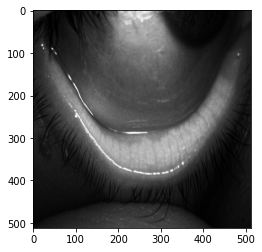

In [13]:
plt.imshow(train_images[35],cmap='gray')

In [14]:
train_masks[35].shape

(512, 512)

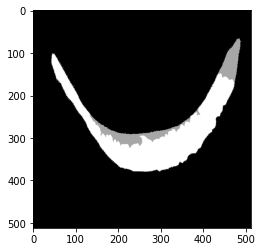

In [15]:
plt.imshow(train_masks[35],cmap='gray')

In [16]:
train_images[35].shape

(512, 512)

In [17]:
#Encode labels to [0, 1, 2]... but multi dim array needs to be flattened first, encode and reshape
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w = train_masks.shape
train_masks_reshaped = train_masks.reshape(-1,1)
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w)
np.unique(train_masks_encoded_original_shape)

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0, 1, 2])

In [18]:
train_masks.shape

(2000, 512, 512)

In [19]:
train_masks_reshaped.shape

(524288000, 1)

In [20]:
train_masks_reshaped_encoded.shape

(524288000,)

In [21]:
train_masks_encoded_original_shape.shape

(2000, 512, 512)

In [22]:
# Expanding one dimension for U-Net model
train_images = np.expand_dims(train_images, axis=3)
train_images = normalize(train_images, axis=1)
train_masks_input = np.expand_dims(train_masks_encoded_original_shape, axis=3)

In [23]:
train_images.shape

(2000, 512, 512, 1)

In [24]:
train_masks_input.shape

(2000, 512, 512, 1)

In [25]:
# Selecting 10% for testing and remaining for training on augmented dataset
from sklearn.model_selection import train_test_split
# X1, X_test, y1, y_test = train_test_split(train_images, train_masks_input, test_size = 0.10, random_state = 0)
X_train, X_test, y_train, y_test = train_test_split(train_images, train_masks_input, test_size = 0.10, random_state = 0)

# Create a subset of data for quick testing (optional)
# Further split training data to a smaller subset for quick testing of models
# X_train, X_do_not_use, y_train, y_do_not_use = train_test_split(X1, y1, test_size = 0.2, random_state = 0)

print("Class values in the dataset are ... ", np.unique(y_train))  # 0 is the background/few unlabeled 

Class values in the dataset are ...  [0 1 2]


In [26]:
y_train.shape

(1800, 512, 512, 1)

In [27]:
y_test.shape

(200, 512, 512, 1)

In [28]:
# Convert it to categorical data - one-hot encoding
from tensorflow.keras.utils import to_categorical
train_masks_cat = to_categorical(y_train, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [29]:
y_test_cat.shape

(200, 512, 512, 3)

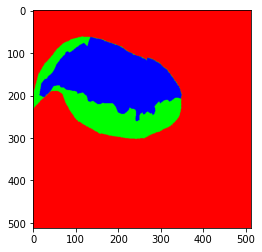

In [30]:
# train_masks_input.shape
plt.imshow(y_test_cat[5],cmap='gray')

##### (This code below is for calculating weights for each class, but I skipped this step due to an error I faced while training the model with these weights)

In [31]:
# from sklearn.utils import class_weight
# class_weights = class_weight.compute_class_weight('balanced',
#                                                  np.unique(train_masks_reshaped_encoded),
#                                                  train_masks_reshaped_encoded)
# print("Class weights are...:", class_weights)

In [32]:
X_train.shape

(1800, 512, 512, 1)

### 1.3 Get the Multi-Class U-Net Model

In [33]:
IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH  = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]

def get_model():
    return multi_unet_model(n_classes=n_classes, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_CHANNELS=IMG_CHANNELS)

### 1.4 U-Net Model Summary

In [34]:
# model = get_model()

# # run_opts = tf.RunOptions(report_tensor_allocations_upon_oom = True)
# model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# model.summary()

model = get_model()

# run_opts = tf.RunOptions(report_tensor_allocations_upon_oom = True)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 512, 512, 16) 160         input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 512, 512, 16) 0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 512, 512, 16) 2320        dropout[0][0]                    
______________________________________________________________________________________________

### 1.5 Training the Model

In [35]:
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)

# Use 'class_weight' If starting with pre-calculated weights above.
history = model.fit(X_train, y_train_cat, 
                    batch_size = 16, 
                    verbose=1, 
                    epochs=2000, 
                    validation_data=(X_test, y_test_cat), 
#                     class_weight=class_weights,
                    shuffle=False, 
                    callbacks=[es])

Epoch 1/2000
113/113 [==============================] - 44s 263ms/step - loss: 0.8218 - accuracy: 0.7198 - val_loss: 0.5961 - val_accuracy: 0.7471
Epoch 2/2000
113/113 [==============================] - 16s 143ms/step - loss: 0.5764 - accuracy: 0.7567 - val_loss: 0.5571 - val_accuracy: 0.7959
Epoch 3/2000
113/113 [==============================] - 17s 153ms/step - loss: 0.5397 - accuracy: 0.8037 - val_loss: 0.5013 - val_accuracy: 0.8165
Epoch 4/2000
113/113 [==============================] - 18s 162ms/step - loss: 0.4818 - accuracy: 0.8222 - val_loss: 0.4632 - val_accuracy: 0.8283
Epoch 5/2000
113/113 [==============================] - 17s 146ms/step - loss: 0.4409 - accuracy: 0.8352 - val_loss: 0.4139 - val_accuracy: 0.8407
Epoch 6/2000
113/113 [==============================] - 16s 141ms/step - loss: 0.3930 - accuracy: 0.8501 - val_loss: 0.3864 - val_accuracy: 0.8497
Epoch 7/2000
113/113 [==============================] - 15s 137ms/step - loss: 0.3641 - accuracy: 0.8589 - val_loss: 0

In [36]:
# Save the model in the current directory
model.save('/data/Unet_data/model/test3_atrophied_glands_1.hdf5')

In [37]:
# Evaluate the model
_, acc = model.evaluate(X_test, y_test_cat)
print("Accuracy is = ", (acc * 100.0), "%")

7/7 [==============================] - 2s 56ms/step - loss: 0.2744 - accuracy: 0.9133
Accuracy is =  91.33155941963196 %


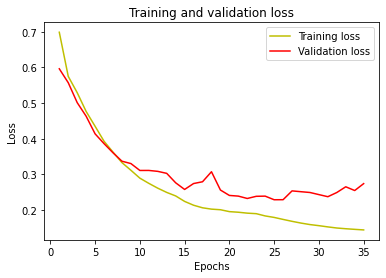

In [38]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### 1.6 Caluculating IoU on the Augmented Dataset

In [39]:
#model = get_model()
model.load_weights('/data/Unet_data/model/test3_atrophied_glands_1.hdf5')   

#IOU
y_pred=model.predict(X_test)
y_pred_argmax=np.argmax(y_pred, axis=3)

In [40]:
#Using built in keras function for mean IoU
from tensorflow.keras.metrics import MeanIoU

IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y_test[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.6949484


In [41]:
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[1,0] + values[2,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[0,1]+ values[2,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[0,2]+ values[1,2])
# class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2] + values[0,3]+ values[1,3]+ values[2,3])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
# print("IoU for class4 is: ", class4_IoU)

# plt.imshow(train_images[0, :,:,0], cmap='gray')
# plt.imshow(train_masks[0], cmap='gray')

[[38440558.   388484.   342026.]
 [ 1116153.  2994082.  1057512.]
 [  830884.   809697.  6449404.]]
IoU for class1 is:  0.9348815564335954
IoU for class2 is:  0.47032922772610686
IoU for class3 is:  0.679634160747595


In [42]:
len(y_test)

200

### 1.7 Prediction on 200 Images & Annotations

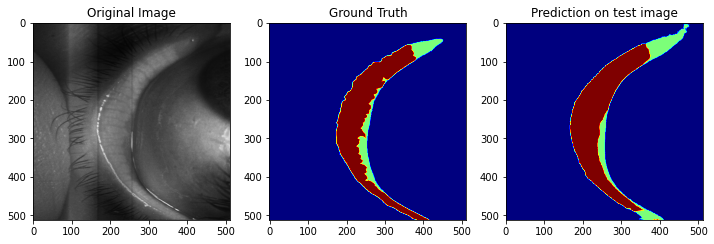

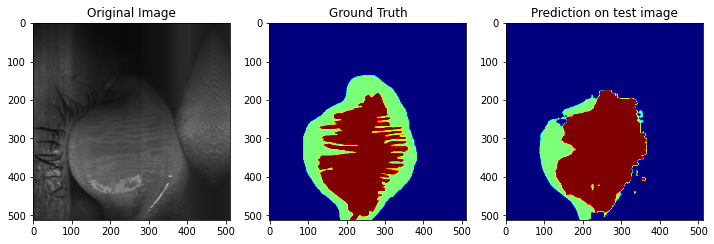

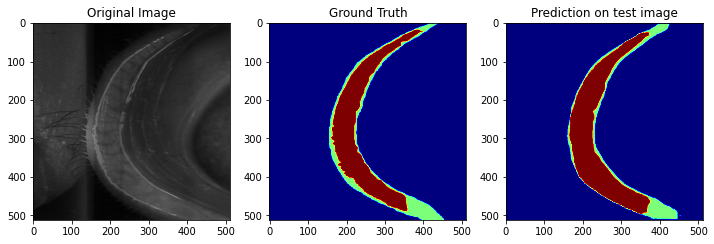

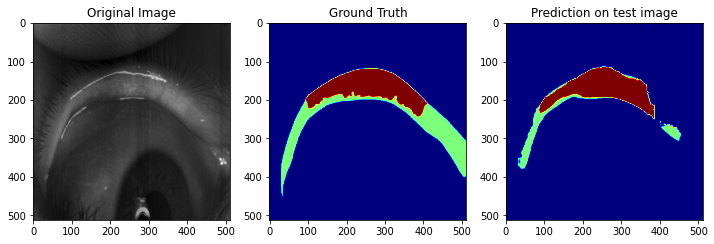

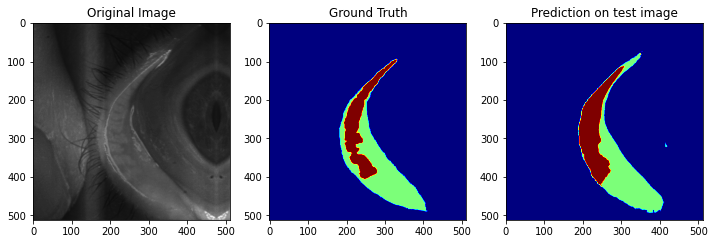

...

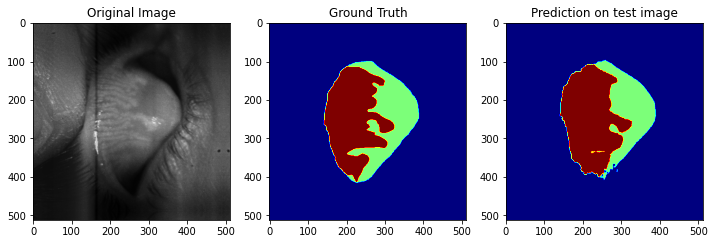

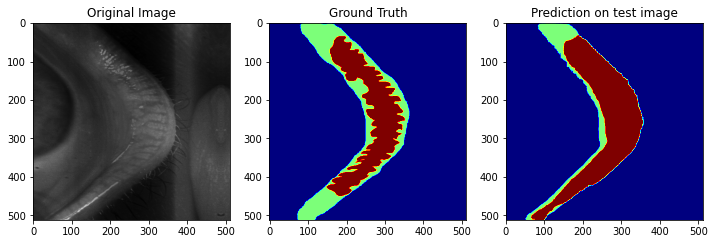

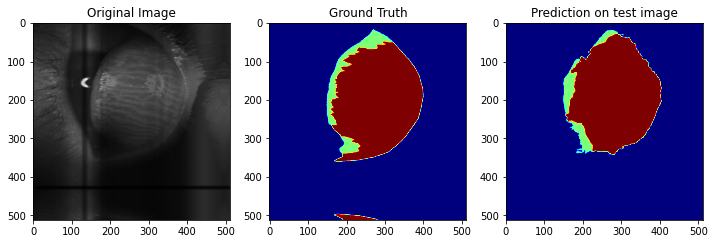

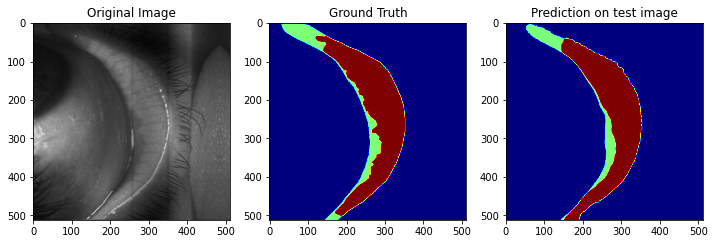

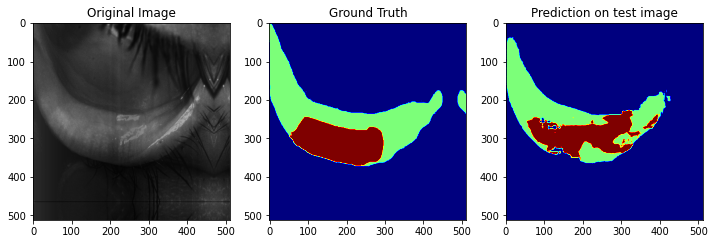

KeyboardInterrupt: 

In [86]:
#model = get_model()
Array_m = np.empty([0,0], dtype=int)
Array_1 = np.empty([0,0], dtype=int)
Array_2 = np.empty([0,0], dtype=int)
Array_3 = np.empty([0,0], dtype=int)

import random
# test_img_number = random.randint(0, len(X_test))
# test_img = X_test[test_img_number]
for i in range(0, 200):
    test_img_number = i
    test_img = X_test[test_img_number]
    ground_truth=y_test[test_img_number]
    test_img_norm=test_img[:,:,0][:,:,None]
    test_img_input=np.expand_dims(test_img_norm, 0)
    prediction = (model.predict(test_img_input))
    predicted_img=np.argmax(prediction, axis=3)[0,:,:]

# #     Comment out this section to hide the visualization results ---------------------------------------
    plt.figure(figsize=(12, 8))
    plt.subplot(231)
    plt.title('Original Image')
    plt.imshow(test_img[:,:,0], cmap='gray')
    plt.subplot(232)
    plt.title('Ground Truth')
    plt.imshow(ground_truth[:,:,0], cmap='jet')
    plt.subplot(233)
    plt.title('Prediction on test image')
    plt.imshow(predicted_img, cmap='jet')
    plt.show()
    
    # IoU for each prediciton result---------------------------------------------------
    IOU_keras.update_state(y_test[i,:,:,0], y_pred_argmax[i])
    mean_IoU = round(IOU_keras.result().numpy(),3)
#     print("Mean IoU =", mean_IoU)
    #To calculate I0U for each class...
    values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
#     print(values)
    class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[1,0] + values[2,0])
    class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[0,1] + values[2,1])
    class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[0,2] + values[1,2])

#     print("IoU for class 1 is: ", round(class1_IoU,3))
#     print("IoU for class 2 is: ", round(class2_IoU,3))
#     print("IoU for class 3 is: ", round(class3_IoU,3))
    
    Array_m = np.append(Array_m, mean_IoU)
    Array_1 = np.append(Array_1, class1_IoU)
    Array_2 = np.append(Array_2, class2_IoU)
    Array_3 = np.append(Array_3, class3_IoU)

### 1.8 Creating a Box-Whisker Plot from the Above Result

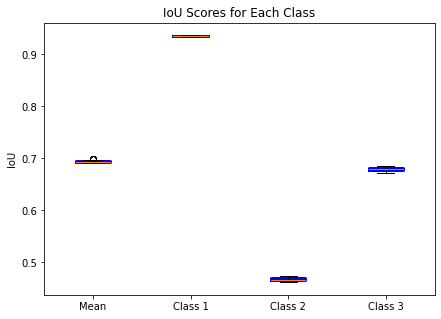

In [44]:
fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bpm = ax.boxplot(Array_m, positions=[1], widths=0.35, boxprops=boxprops1)
bp1 = ax.boxplot(Array_1, positions=[2], widths=0.35, boxprops=boxprops1)
bp2 = ax.boxplot(Array_2, positions=[3], widths=0.35, boxprops=boxprops1)
bp3 = ax.boxplot(Array_3, positions=[4], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('IoU')
ax.set_xticklabels(['Mean', 'Class 1', 'Class 2', 'Class 3'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])
plt.title("IoU Scores for Each Class")
plt.show()

## 2. Testing on 29 unseen dataset
* This will be almost identical to the above steps on augmented dataset.
* When loading images, unlike the first step in the augmented dataset, dictionary is used here before storing data directly into list to store images in a matching order.

### 2.1 Storing image paths in a matching order

In [45]:
i=0
dict_x = {}
images_path = []

# Load image paths from 29 dataset folder
train_images2 = []
# for directory_path in glob.glob("/data/Unet_data/ex_x_29/*.bmp"):
for directory_path in glob.glob(img_unseen_path):
    img_name = directory_path.split('/')
    img_name = img_name[5].split('.')
    dict_x[img_name[0]] = i
    i+=1
    images_path.append(directory_path)

dict_y = {}
# Load annotation paths from 29 dataset folder
# for directory_path in glob.glob("/data/Unet_data/ex_y_29/*.jpg"):
for directory_path in glob.glob(msk_unseen_path):
    mask_name = directory_path.split('/')
    mask_name = mask_name[5].split('.')
    mask_name=mask_name[0]
    if mask_name in dict_x:
        dict_y[dict_x[mask_name]] = directory_path
# print(dict_y)
masks_path = []

# # Match the order of files in train_masks2 to imags_path, store y paths in list 'masks_path'
for i in sorted(dict_y.keys()):
    masks_path.append(dict_y[i])

#### Confirm that file paths are stored in a matching order

In [46]:
images_path[:5]

['/data/Unet_data/v0.3-atrophied-glands/testing-30-x/2020_02_05_10_30_42_46074771.bmp',
 '/data/Unet_data/v0.3-atrophied-glands/testing-30-x/2020_02_05_10_30_42_46374990.bmp',
 '/data/Unet_data/v0.3-atrophied-glands/testing-30-x/2020_02_05_10_30_42_46383988.bmp',
 '/data/Unet_data/v0.3-atrophied-glands/testing-30-x/2020_02_05_10_38_21_46197185.bmp',
 '/data/Unet_data/v0.3-atrophied-glands/testing-30-x/2020_02_05_10_38_21_46067465.bmp']

In [47]:
masks_path[:5]

['/data/Unet_data/v0.3-atrophied-glands/testing-30-y/2020_02_05_10_30_42_46074771.jpg',
 '/data/Unet_data/v0.3-atrophied-glands/testing-30-y/2020_02_05_10_30_42_46374990.jpg',
 '/data/Unet_data/v0.3-atrophied-glands/testing-30-y/2020_02_05_10_30_42_46383988.jpg',
 '/data/Unet_data/v0.3-atrophied-glands/testing-30-y/2020_02_05_10_38_21_46197185.jpg',
 '/data/Unet_data/v0.3-atrophied-glands/testing-30-y/2020_02_05_10_38_21_46067465.jpg']

In [48]:
# #Resizing images, if needed
# # SIZE_X = 2304
# # SIZE_Y = 1536

SIZE_X = IMG_WIDTH
SIZE_Y = IMG_HEIGHT

# Converting image paths to images
train_images3 = []
for path in images_path:
    path = os.path.normpath(path)
    img = cv2.imread(path, 0)
     #---------------------------------------------
#   Try this code block to give basic enhancements
#     img = Image.fromarray(img)
#     img = ImageEnhance.Contrast(img)  
#     img = img.enhance(1.1)
#     img = np.array(img)
    #---------------------------------------------
    img = cv2.resize(img, (SIZE_Y, SIZE_X))
    train_images3.append(img)
# #Convert list to array for machine learning processing        
train_images3 = np.array(train_images3)

# Converting annotation paths into images

train_masks3 = []
for path in masks_path:
    path = os.path.normpath(path)
    mask = cv2.imread(path, 0)
    mask = cv2.resize(mask, (SIZE_Y, SIZE_X), interpolation = cv2.INTER_NEAREST)  #Otherwise ground truth changes due to interpolation
    mask[(mask>=7) & (mask<140)] = 97 # use this for 'atrophied glands'
#     mask[(mask>=7) & (mask<140)] = 0 # use this for 'characterizing glands'
    mask[mask>=140] = 148
    mask[mask<7] = 0
    train_masks3.append(mask)
#Convert list to array for machine learning processing          
train_masks3 = np.array(train_masks3)

In [49]:
# train_masks
(unique,counts)=np.unique(train_masks3[0],return_counts=True)
frequencies = np.asarray((unique, counts)).T
print(frequencies)

[[     0 184286]
 [    97  39604]
 [   148  38254]]


In [50]:
len(train_images3)

30

In [51]:
len(train_masks3)

30

In [52]:
#Encode labels to [0, 1, 2]... but multi dim array so need to flatten, encode and reshape
# from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w = train_masks3.shape
train_masks_reshaped3 = train_masks3.reshape(-1,1)
train_masks_reshaped_encoded3 = labelencoder.fit_transform(train_masks_reshaped3)
# train_masks_reshaped_encoded.shape
train_masks_encoded_original_shape3 = train_masks_reshaped_encoded3.reshape(n, h, w)
# train_masks_encoded_original_shape
np.unique(train_masks_encoded_original_shape3)

/usr/local/lib/python3.8/dist-packages/sklearn/preprocessing/_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0, 1, 2])

In [53]:
train_masks3.shape

(30, 512, 512)

In [54]:
train_masks_reshaped3.shape

(7864320, 1)

In [55]:
train_masks_reshaped_encoded3.shape

(7864320,)

In [56]:
train_masks_encoded_original_shape3.shape

(30, 512, 512)

In [57]:
# Expanding one dimension for U-Net model
train_images3 = np.expand_dims(train_images3, axis=3)
train_images3 = normalize(train_images3, axis=1)
train_masks_input3 = np.expand_dims(train_masks_encoded_original_shape3, axis=3)

In [58]:
train_images3.shape

(30, 512, 512, 1)

#### Since we're not splitting data here, names are only replaced to 'X_test3' and 'y_test3' as if they were split into test and training data.

In [59]:
X_test3 = train_images3
y_test3 = train_masks_input3

In [60]:
y_test3.shape

(30, 512, 512, 1)

In [61]:
# y_test3[0]

In [62]:
# Convert it to categorical data - one-hot encoding
from tensorflow.keras.utils import to_categorical
# train_masks_cat = to_categorical(y_train, num_classes=n_classes)
# y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))

test_masks_cat3 = to_categorical(y_test3, num_classes=n_classes)
y_test_cat3 = test_masks_cat3.reshape((y_test3.shape[0], y_test3.shape[1], y_test3.shape[2], n_classes))

In [63]:
test_masks_cat3.shape

(30, 512, 512, 3)

In [64]:
# test_masks_cat3[0]

In [65]:
y_test_cat3.shape

(30, 512, 512, 3)

In [66]:
y_test_cat3[0].shape
# y_test_cat3[0]

(512, 512, 3)

In [67]:
X_test3.shape

(30, 512, 512, 1)

In [68]:
# X_test3[0]

### 2.2 Prediction on 29 images & annotations
* This following code cell is for visualizing original image, ground truth & prediction results, and overlaying results on top of original images.
* IoU score is also calculated for each prediction result & annotation.

In [69]:
# !pip install scikit-learn==0.19.0.dev0
# !pip install git+https://github.com/jni/skan

In [70]:
from skimage import measure, io, img_as_ubyte, img_as_float, color
from skimage.color import label2rgb, rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import skeletonize
from skimage.util import invert
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import ndimage
import math

from fil_finder import FilFinder2D, Filament2D
from astropy.io import fits
import astropy.units as u
import seaborn as sb
from skan import draw, Skeleton, summarize

In [71]:
IOU_keras3 = MeanIoU(num_classes=n_classes)

X_test3 = train_images3
y_pred3 = model.predict(X_test3)
y_pred_argmax3 = np.argmax(y_pred3, axis=3)

y_test4 = y_test_cat3

# SIZE_X = 2304
# SIZE_Y = 1536
new_width = SIZE_X
new_height = SIZE_Y

# These arrays are for creating Box-Whisker plot for mean IoU in the next code cell--------
array_m = np.empty([0,0], dtype=int)
array_1 = np.empty([0,0], dtype=int)
array_2 = np.empty([0,0], dtype=int)
array_3 = np.empty([0,0], dtype=int)
# These arrays are for creating a scatter plot in the next code cell----------
scatter_pred_y = np.empty([0,0], dtype=int)
scatter_ground_x = np.empty([0,0], dtype=int)
# These arrays are for creating Box-Whisker plot for gland metrics in the next code cell--------
array_l = np.empty([0,0], dtype=int)
array_w = np.empty([0,0], dtype=int)
array_t = np.empty([0,0], dtype=int)

#### This following cell is for characterizing glands

num_labels: 3


ValueError: Image contains values other than 0 and 1

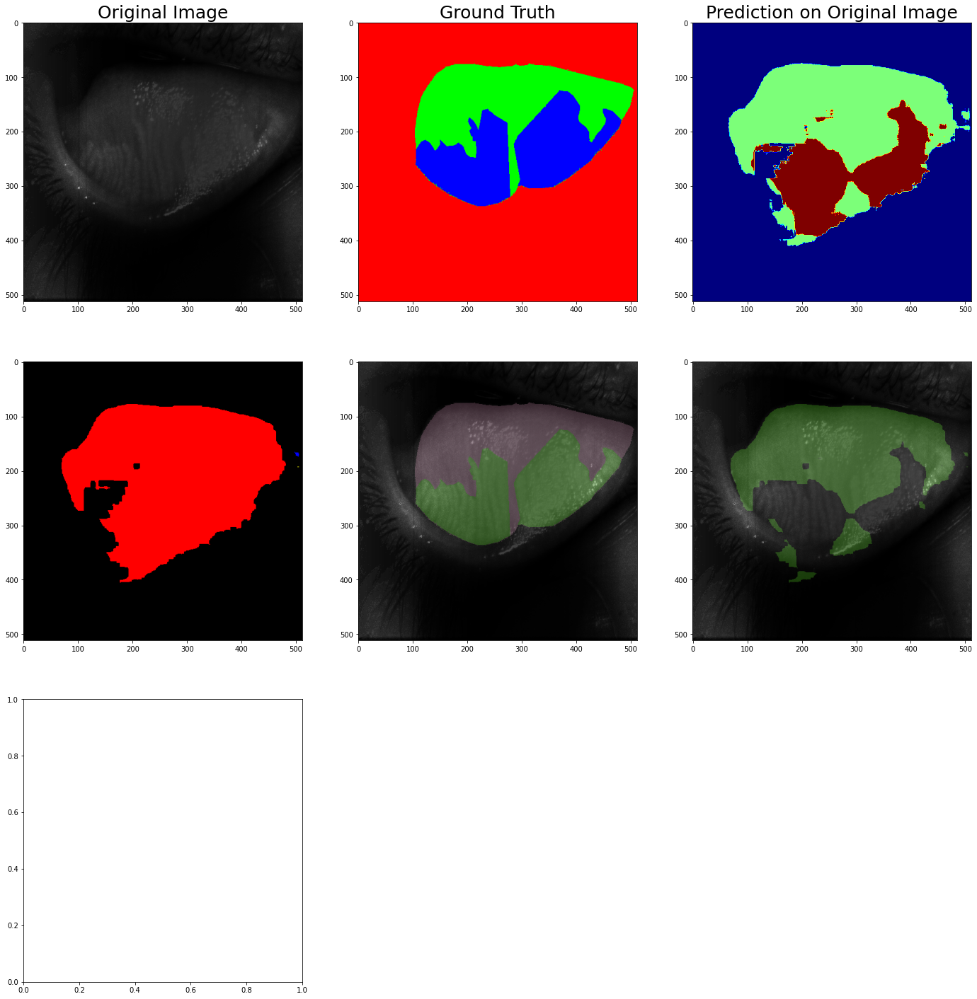

In [72]:
# for i in range(0, 28): # for v0.2
for i in range(0, 50):
    test_img_number = i
    test_img = X_test3[test_img_number]
    ground_truth=y_test4[test_img_number]
    ground_truth2 = ground_truth.astype(int)
    test_img_norm=test_img[:,:,0][:,:,None]
    test_img_input=np.expand_dims(test_img_norm, 0)
    prediction = (model.predict(test_img_input))
    predicted_img=np.argmax(prediction, axis=3)[0,:,:]
    
    # Calculating loss -------------------------------------------------
#     ground_truth2=np.argmax(ground_truth, axis=2)[:,:]
#     print("ground_truth:", ground_truth)
#     print('test_img.shape:', test_img.shape)
#     print('ground_truth.shape:', ground_truth2.shape)
#     print('test_img_norm.shape:', test_img_norm.shape)
#     print('test_img_input.shape:', test_img_input.shape)
#     print('prediction.shape:', prediction.shape)
#     print('predicted_img.shape:', predicted_img.shape)
#     print(predicted_img)
    
    ### uncomment for atrophied glands, comment out for separating glands -------------------------------------
#     # Print unique values of the ground truth
#     background = np.sum(ground_truth[:,:,0]==1)
#     eyelid = np.sum(ground_truth[:,:,1]==1)
# #     glands = np.sum(ground_truth[:,:,2]==1)
# #     print('ind0:', ind0)
# #     print('ind1:', ind1)
# #     print('ind2:', ind2)
#     # Calculate gland loss
#     atrophy_g = (eyelid/(eyelid+glands)) * 100
#     atrophy_g = round(atrophy_g, 2)
# #     print("Gland loss for the below ground truth: {}%".format(atrophy_g))
#     scatter_ground_x = np.append(scatter_ground_x, atrophy_g) # Append to numpy array to create a scatter plot
    
#     # Print unique values of the prediction
#     (unique,counts)=np.unique(predicted_img,return_counts=True)
#     frequencies = np.asarray((unique, counts)).T
# #     print("Unique values for the below prediction:\n", frequencies)
#     # Calculate gland loss
#     eyelid = frequencies[1,1]
#     glands = frequencies[2,1]
#     atrophy_p = (eyelid/(eyelid+glands)) * 100
#     atrophy_p = round(atrophy_p, 2)
# #     print("Gland loss for the below prediction: {}%".format(atrophy_p))
#     scatter_pred_y = np.append(scatter_pred_y, atrophy_p) # Append to numpy array to create a scatter plot
    ### ------------------------------------------------------------------------------------------------------
    
#     plt.hist(predicted_img.flat, bins=100, range=(0,5))
    
#     plt.figure(figsize=(12, 24))
#     plt.figure(figsize=(24, 16))
    plt.figure(figsize=(24, 25))

#     plt.subplot(231)
    plt.subplot(3,3,1)
    plt.title('Original Image',fontsize=25)
    test_img = cv2.resize(test_img[:,:,0], (new_width, new_height))
    plt.imshow(test_img, cmap='gray')

#     plt.subplot(232)
    plt.subplot(3,3,2)
    plt.title('Ground Truth',fontsize=25)
    ground_truth = cv2.resize(ground_truth, (new_width, new_height))
    ground_truth_img=np.argmax(ground_truth, axis=2)[:,:]
    plt.imshow(ground_truth, cmap='jet')
    
#     plt.subplot(233)
    plt.subplot(3,3,3)
    plt.title('Prediction on Original Image',fontsize=25)
    predicted_img = predicted_img.reshape((new_width, new_height)).astype('float32')
    predicted_img = cv2.resize(predicted_img, (new_width, new_height))
    plt.imshow(predicted_img, cmap='jet')
    
#     For erosion ----------------------------------------------------------------------
# #     ret, th = cv2.threshold(predicted_img, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    kernel = np.ones((3,3), np.uint8)
    if (i >= 20) and (i <= 24):
        predicted_img = cv2.erode(predicted_img, kernel, iterations=5)
    else:
        predicted_img = cv2.erode(predicted_img, kernel, iterations=3)
#   ------------------------------------------------------------------------------------
     
    predicted_img_sk = predicted_img.copy() # copy for skeletonizing
    predicted_img_tor = predicted_img.copy() # copy for tortuosity
    
#     (unique,counts)=np.unique(predicted_img,return_counts=True)
#     frequencies = np.asarray((unique, counts)).T
#     frequencies = frequencies.astype(int)
#     print(frequencies)
    
    # Observe each separated glands in different colors
    plt.subplot(3,3,4)
    s = [[1,1,1], [1,1,1], [1,1,1]]
    labeled_mask, num_labels = ndimage.label(predicted_img, structure=s)
    print('num_labels:', num_labels)
    img2 = color.label2rgb(labeled_mask, bg_label=0)
    plt.imshow(img2)

    # Save predictions
#     filename = '/data/Unet_data/prediction_y_29/prediction_{}.jpg'.format(i)
#     cv2.imwrite(filename, predicted_img)

    # For some reason, images turned dark, so I multiplied higher values to make them brighter.
#     predicted_img[predicted_img==1] = 150
#     predicted_img[predicted_img==2] = 255
    predicted_img[predicted_img==1] = 255
    
    # Save predictions
#     filename = '/data/Unet_data/prediction_y_29/prediction_{}.jpg'.format(i)
#     cv2.imwrite(filename, predicted_img)
    
    test_img *= 1000
    ground_truth_img[ground_truth_img==1] = 900
    ground_truth_img[ground_truth_img==2] = 1000
#     predicted_img[predicted_img>1.5] = 1000
#     predicted_img[(predicted_img>0.5)&(predicted_img<=1.5)] = 900
#     predicted_img[predicted_img<=0.5] = 0
    
    predicted_img[predicted_img==255] = 1000
    predicted_img[predicted_img==150] = 900

    test_img = Image.fromarray(test_img.astype(np.uint8))
    ground_truth_img = Image.fromarray(ground_truth_img.astype(np.uint8))
    predicted_img = Image.fromarray(predicted_img.astype(np.uint8))
    
    test_img = test_img.convert("RGBA")
    ground_truth_img = ground_truth_img.convert("RGB")
    predicted_img = predicted_img.convert("RGB")

    #---------------------------------------------------------------------------------
    # Change overlaying predictions and annotations to color
    b, g, r = cv2.split(np.array(predicted_img))
    np.multiply(b, 1.5, out=b, casting="unsafe")
    np.multiply(g, 1.0, out=g, casting="unsafe")
    np.multiply(r, 1.25, out=r, casting="unsafe")

    predicted_img = cv2.merge([b, g, r])
    predicted_img = Image.fromarray(predicted_img.astype(np.uint8))
    predicted_img = predicted_img.convert("RGBA")
    
    b, g, r = cv2.split(np.array(ground_truth_img))
    np.multiply(b, 1.5, out=b, casting="unsafe")
    np.multiply(g, 1.0, out=g, casting="unsafe")
    np.multiply(r, 1.25, out=r, casting="unsafe")

    ground_truth_img = cv2.merge([b, g, r])
    ground_truth_img = Image.fromarray(ground_truth_img.astype(np.uint8))
    ground_truth_img = ground_truth_img.convert("RGBA")
    #---------------------------------------------------------------------------------
    ### Plot figures
    #     ground_truth_img.putalpha(500)
#     predicted_img.putalpha(500)

    # change number(0.25) for different transparencies
#     groundtruth_overlay = Image.blend(test_img, ground_truth_img, 0.25)
    predicted_overlay = Image.blend(test_img, predicted_img, 0.25)
#     display(groundtruth_overlay, predicted_overlay)
    plt.subplot(3,3,5)
#     predicted_img = cv2.resize(np.array(groundtruth_overlay), (new_width, new_height))
    groundtruth_overlay = Image.blend(test_img, ground_truth_img, 0.25)
    plt.imshow(groundtruth_overlay)
    
    plt.subplot(3,3,6)
    predicted_img = cv2.resize(np.array(predicted_overlay), (new_width, new_height))
    plt.imshow(predicted_overlay)

    plt.subplot(3,3,7)
    skeleton = skeletonize(predicted_img_sk)
    plt.imshow(skeleton, cmap='gray')
    
        ### Measruing tortuosity
    plt.subplot(3,3,8)
    fil = FilFinder2D(skeleton, distance=250 * u.pc, mask=skeleton)
    fil.preprocess_image(flatten_percent=85)
    fil.create_mask(border_masking=True, verbose=False, use_existing_mask=True)
    fil.medskel(verbose=False)
    # fil.analyze_skeletons(branch_thresh=40 * u.pix, skel_thresh=10 * u.pix, prune_criteria='length')
    fil.analyze_skeletons(branch_thresh = 5 * u.pix, skel_thresh = 10 * u.pix, prune_criteria='length')
    plt.imshow(fil.skeleton, cmap='gray')
    plt.contour(fil.skeleton_longpath, colors='r')
    plt.axis('off')
    
#     plt.subplot(3,3,9)
#     fig, ax = plt.subplots()
#     draw.overlay_skeleton_2d(predicted_img, fil.skeleton_longpath, dilate=1, axes=ax)
    
    branch_data = summarize(Skeleton(fil.skeleton_longpath))
    branch_data["tortuosity"] = branch_data["branch-distance"]/branch_data["euclidean-distance"]
    branch_data = branch_data[(branch_data["euclidean-distance"] > new_height * 0.06)] # new_height(512) * 0.06 = 30.72
    tortuosity = round(branch_data["tortuosity"].median(),2)
    print("tortuosity median:", tortuosity)
#     print(branch_data)
    
    draw.overlay_euclidean_skeleton_2d(predicted_img, branch_data,
                                   skeleton_color_source='branch-type')
    
#     # IoU for each prediction result---------------------------------------------------
#     IOU_keras3.update_state(y_test3[i,:,:,0], y_pred_argmax3[i])
#     mean_IoU = round(IOU_keras3.result().numpy(),3)
#     print("Mean IoU =", mean_IoU)
#     #To calculate IoU for each class...
#     values = np.array(IOU_keras3.get_weights()).reshape(n_classes, n_classes)
#     class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[1,0] + values[2,0])
#     class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[0,1] + values[2,1])
#     class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[0,2] + values[1,2])
    
    # Add IoUs
#     plt.subplot(2,3,4)
#     plt.axis('off')
#     plt.gcf().text(0.18, 0.45, "Mean IoU = {}".format(round(mean_IoU), 3), fontsize=25)
#     plt.gcf().text(0.18, 0.42, "IoU for class 1 = {}".format(round(class1_IoU,3)), fontsize=25)
#     plt.gcf().text(0.18, 0.39, "IoU for class 2 = {}".format(round(class2_IoU,3)), fontsize=25)
#     plt.gcf().text(0.18, 0.36, "IoU for class 3 = {}".format(round(class3_IoU,3)), fontsize=25)
    
    # % Print gland loss ------------------------------------------------------------
    ### uncomment for atrophied glands, comment out for separating glands -------------------------------------
#     plt.gcf().text(0.11, 0.42, "Gland loss (ground truth) = {}%".format(round(atrophy_g, 3)), fontsize=22)
#     plt.gcf().text(0.13, 0.39, "Gland loss (prediction) = {}%".format(round(atrophy_p, 3)), fontsize=22)
#     plt.gcf().text(0.21, 0.33, "Difference = {}%p".format(round(abs(atrophy_g - atrophy_p), 3)), fontsize=22)
    ### ------------------------------------------------------------------------------------------------------
    # Save predictions
#     filename = '/data/Unet_data/prediction_y_29/prediction_{}.jpg'.format(i)
#     cv2.imwrite(filename, predicted_img)
# ----------------------------------------------------------------------------------------------------
    ### Measuring regionprops(major_axis_length & minor_axis_length)
#     image = img_as_ubyte(rgb2gray(predicted_img))
# #     image = img_as_ubyte(rgb2gray(rgba2rgb(predicted_img)))

#     threshold = threshold_otsu(image)
#     label_image = measure.label(image < threshold, connectivity=image.ndim)

#     print('image_shape:',image.shape)
#     print('label_image_shape:',label_image.shape)
#     props = measure.regionprops_table(label_image, image,
#                                      properties=['label', 'area', 'equivalent_diameter', 'major_axis_length', 'minor_axis_length'])

    regions = measure.regionprops(labeled_mask)
    fig, ax = plt.subplots()
    ax.imshow(predicted_img, cmap=plt.cm.gray)

    for props in regions:
#         if props['area'] > 100 and props['area'] < 1000:
        if props['area'] > new_height * 0.39:
            y0, x0 = props.centroid
            orientation = props.orientation
            x1 = x0 + math.cos(orientation) * 0.5 * props.minor_axis_length
            y1 = y0 - math.sin(orientation) * 0.5 * props.minor_axis_length
            x2 = x0 - math.sin(orientation) * 0.5 * props.major_axis_length
            y2 = y0 - math.cos(orientation) * 0.5 * props.major_axis_length

            ax.plot((x0, x1), (y0, y1), '-r', linewidth=1.5)
            ax.plot((x0, x2), (y0, y2), '-r', linewidth=1.5)
            ax.plot(x0, y0, '.w', markersize=6)

            minr, minc, maxr, maxc = props.bbox
            bx = (minc, maxc, maxc, minc, minc)
            by = (minr, minr, maxr, maxr, minr)
            ax.plot(bx, by, '-b', linewidth=0.8)

#     ax.axis((0, 600, 600, 0))
#     plt.show()
    
    props = measure.regionprops_table(labeled_mask, predicted_img,
                                     properties=['label', 'area', 'major_axis_length', 'minor_axis_length'])
#     plt.imshow(label_image)
#     plt.show()

    df = pd.DataFrame(props)
    df = df.sort_values(by='major_axis_length', ascending=False)
#     print(df)
#     df1 = df[(df['area'] > 100) & (df['area'] < 1000)]
    df1 = df[(df['area'] > new_height * 0.39)] # new_height(512) * 0.39 = 199.68
#     print('df1:',df1)
    length = round(df1["major_axis_length"].median(),2)
    print("major_axis_length median:", length)
    width = round(df1["minor_axis_length"].median(),2)
    print("minor_axis_length median:", width)
    
# -----------------------------------------------------------------------------------------------------
    print("Below is prediction_{}".format(i))
    
#     plt.savefig('/data/Unet_data/v0.3-atrophied-glands/result-overlaid/gland_loss{}_{}.jpg'.format(round(atrophy_p), i % 3))
    
    plt.show()

    # These arrays are for the Box-Whisker plot--------------------------------------
    array_m = np.append(array_m, mean_IoU)
    array_1 = np.append(array_1, class1_IoU)
    array_2 = np.append(array_2, class2_IoU)
    array_3 = np.append(array_3, class3_IoU) # for atrophied glands
    
    array_l = np.append(array_l, length)
    array_w = np.append(array_w, width)
    array_t = np.append(array_t, tortuosity)

#### This following cell is for calculating gland loss

Unique values for the below prediction:
 [[     0 171839]
 [     1  58580]
 [     2  31725]]
Mean IoU = 0.626
Below is prediction_0


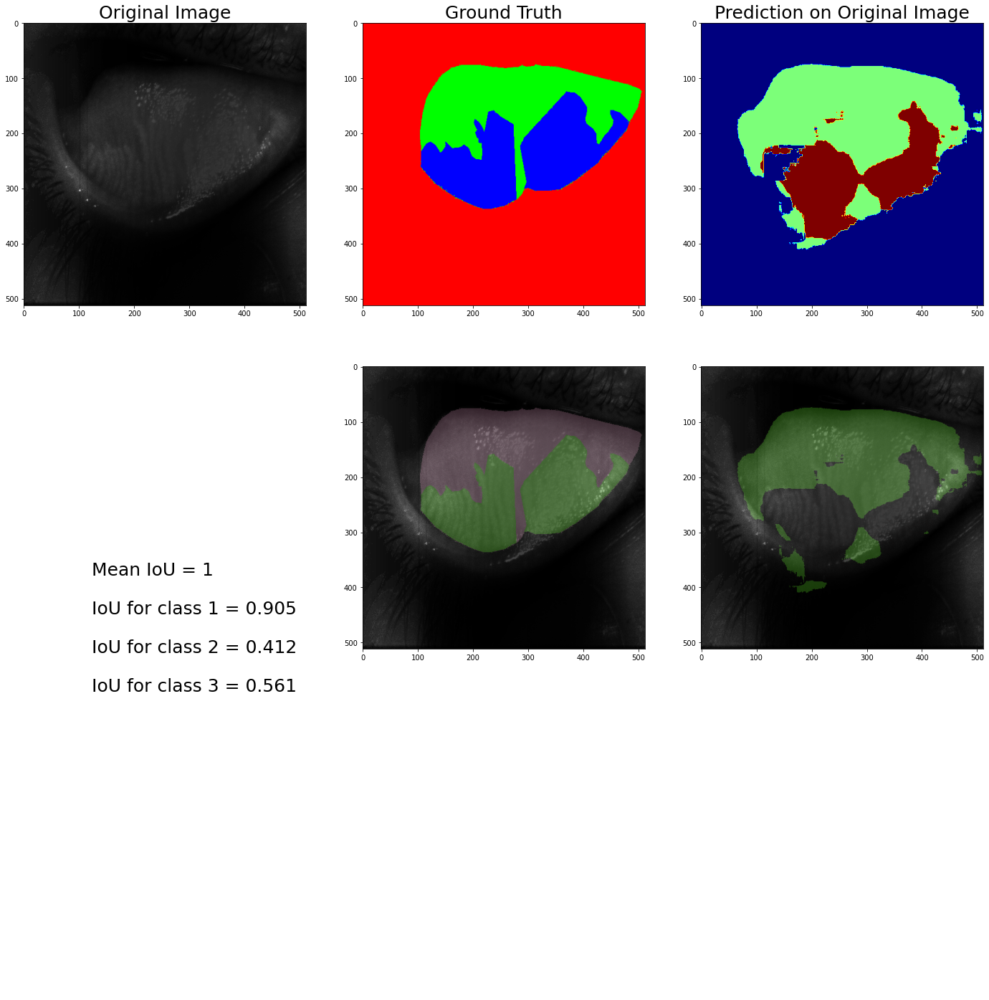

Unique values for the below prediction:
 [[     0 171839]
 [     1  58580]
 [     2  31725]]
Mean IoU = 0.628
Below is prediction_1


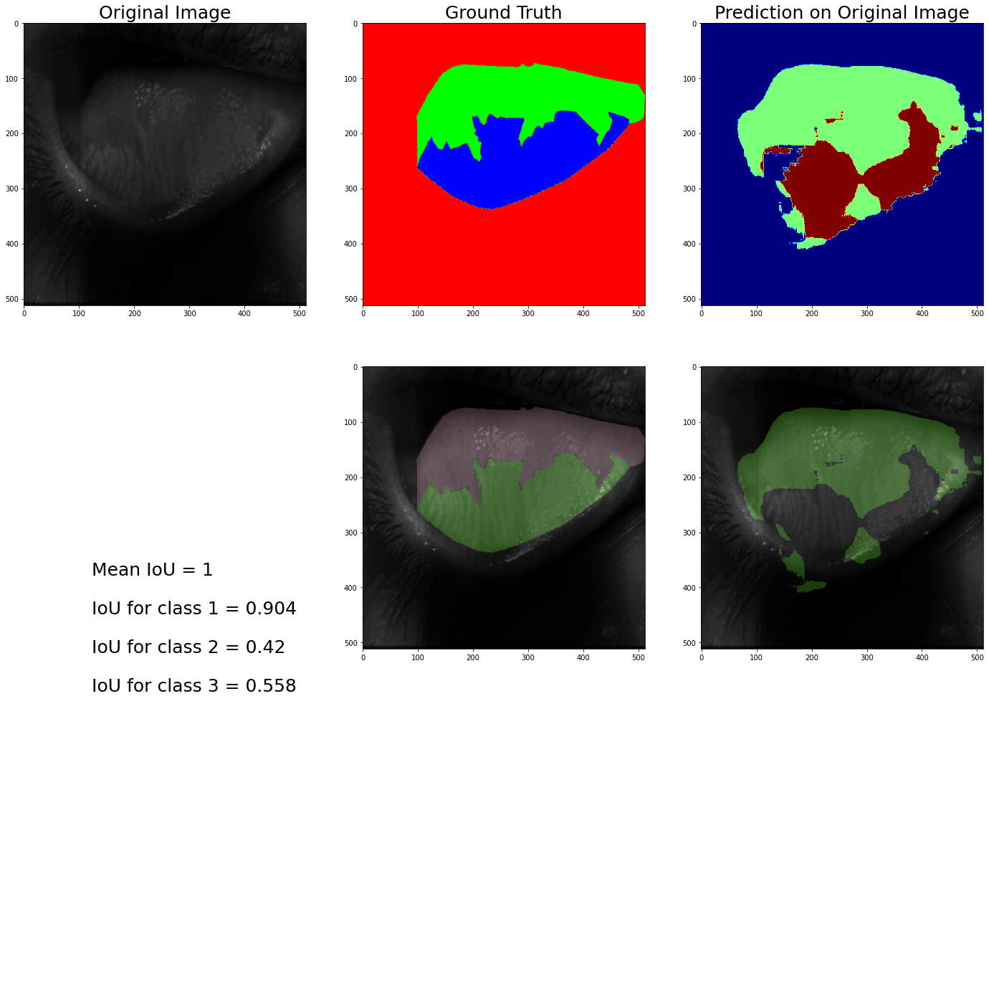

Unique values for the below prediction:
 [[     0 171839]
 [     1  58580]
 [     2  31725]]
Mean IoU = 0.629
Below is prediction_2


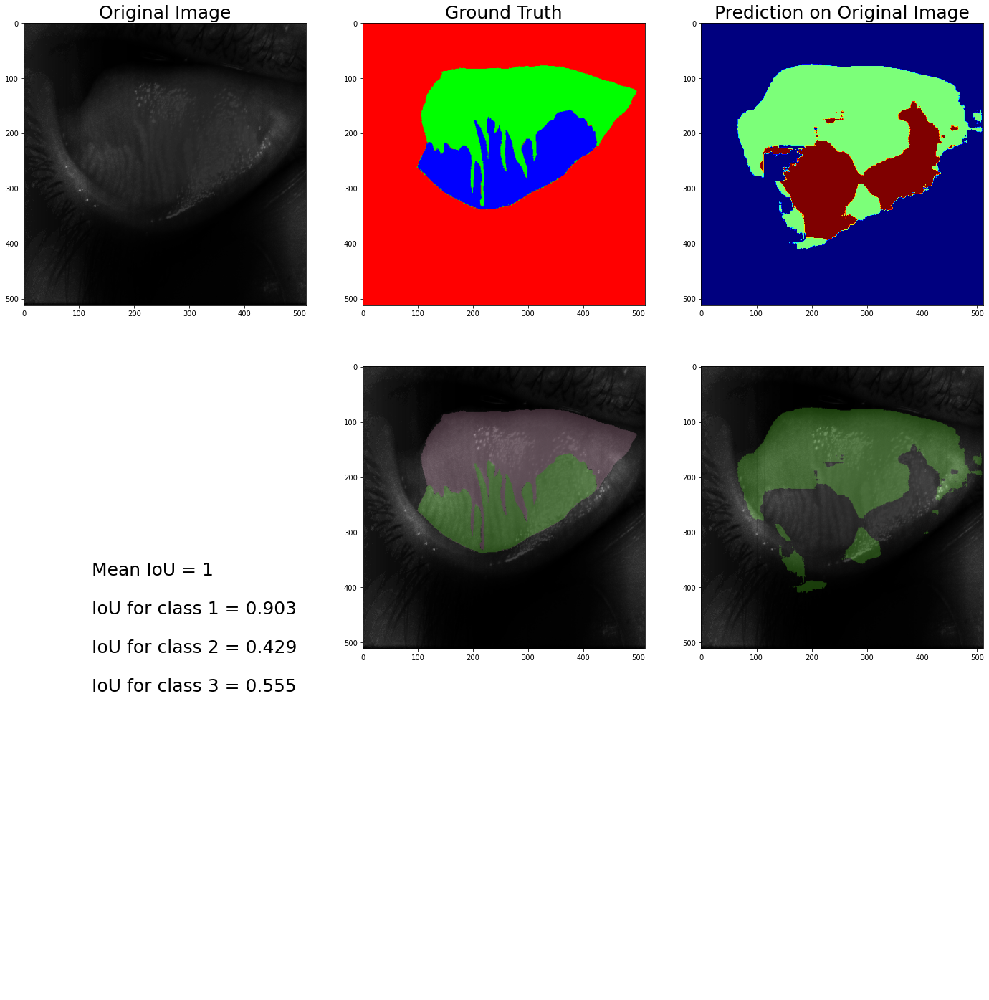

Unique values for the below prediction:
 [[     0 154975]
 [     1  61094]
 [     2  46075]]
Mean IoU = 0.632
Below is prediction_3


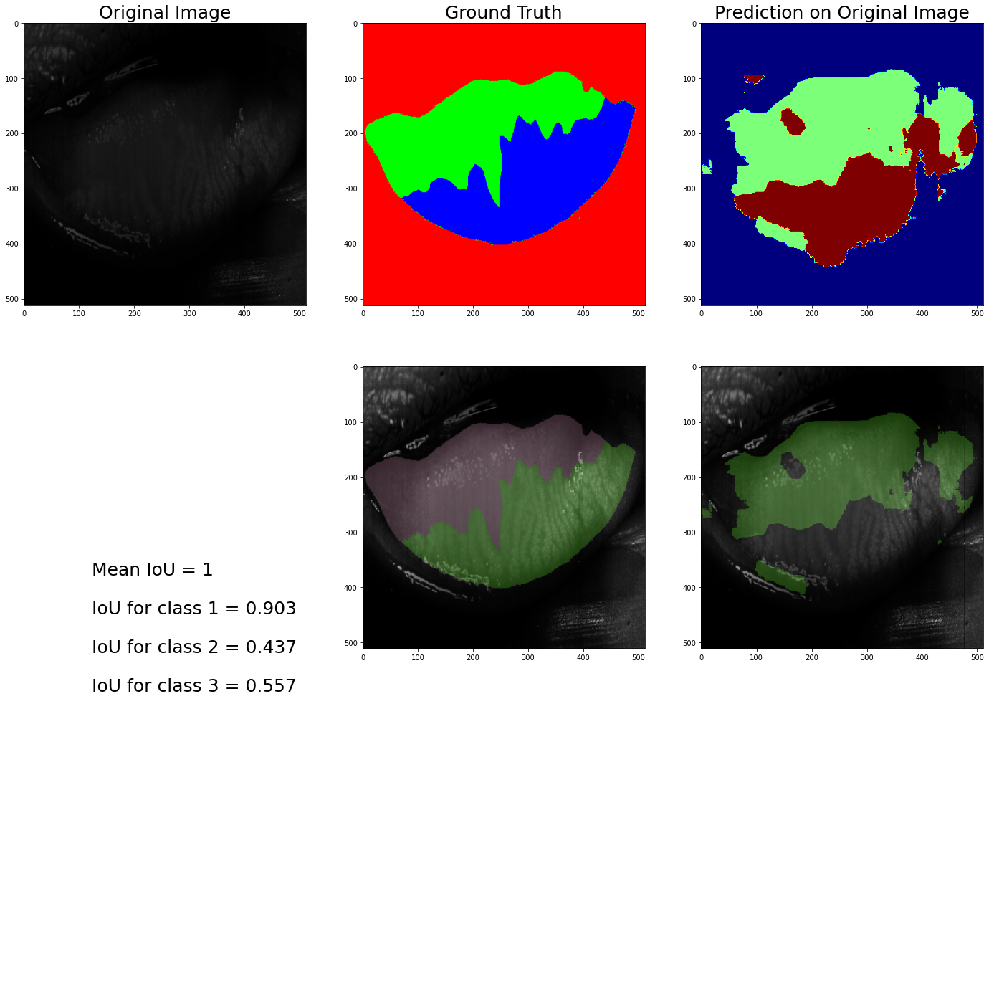

Unique values for the below prediction:
 [[     0 154975]
 [     1  61094]
 [     2  46075]]
Mean IoU = 0.634
Below is prediction_4


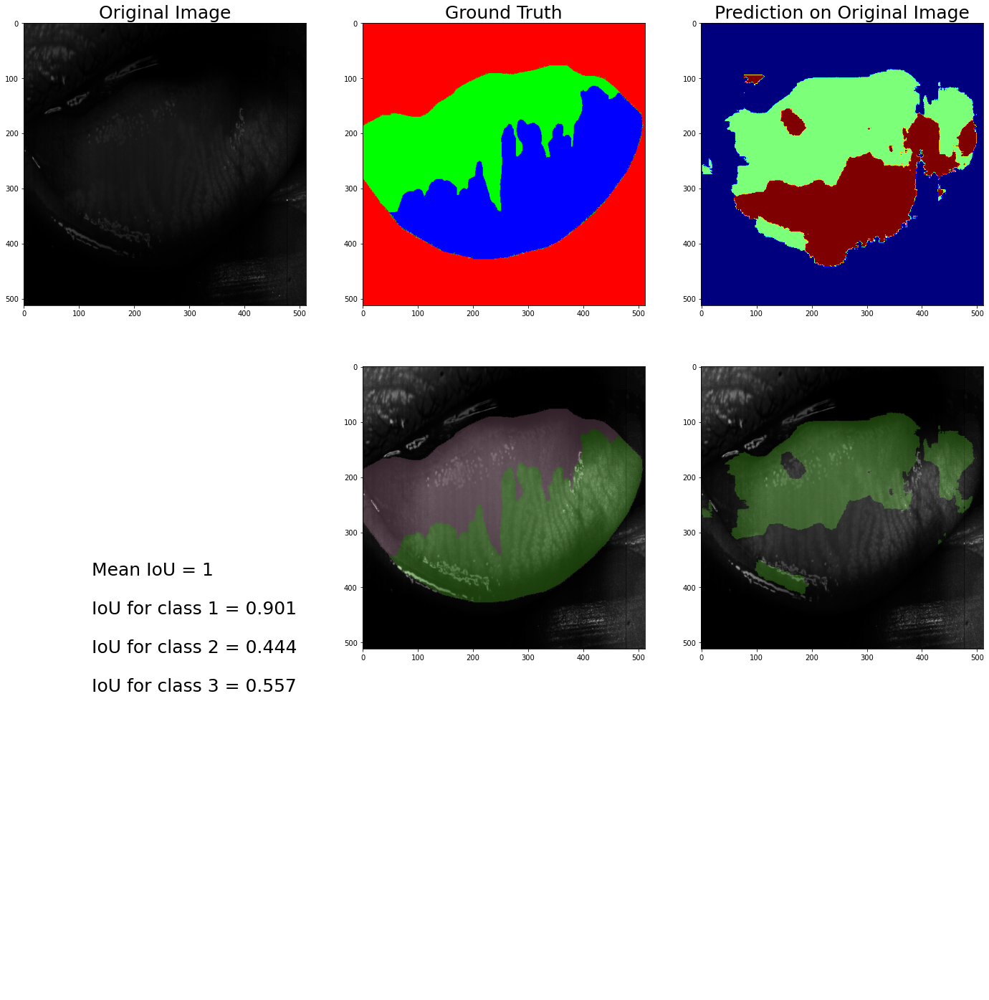

Unique values for the below prediction:
 [[     0 154975]
 [     1  61094]
 [     2  46075]]
Mean IoU = 0.637
Below is prediction_5


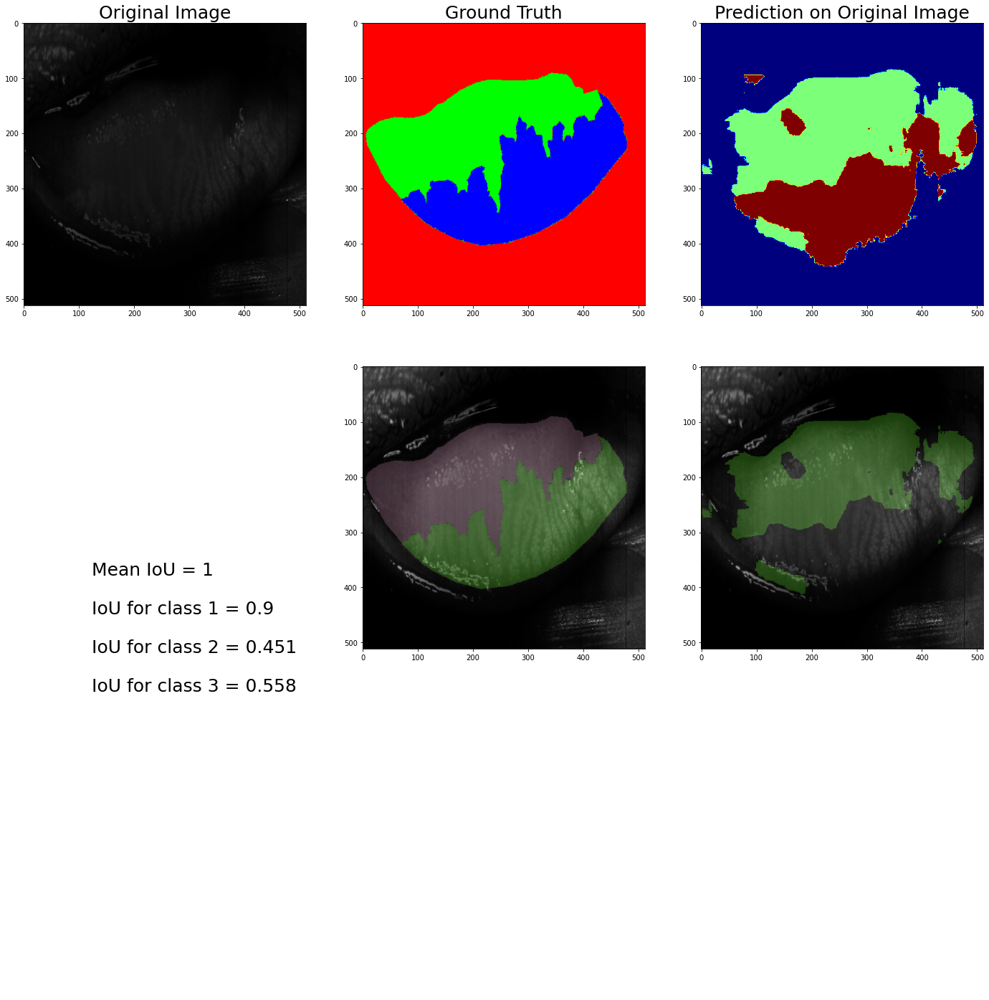

Unique values for the below prediction:
 [[     0 198348]
 [     1  25596]
 [     2  38200]]
Mean IoU = 0.633
Below is prediction_6


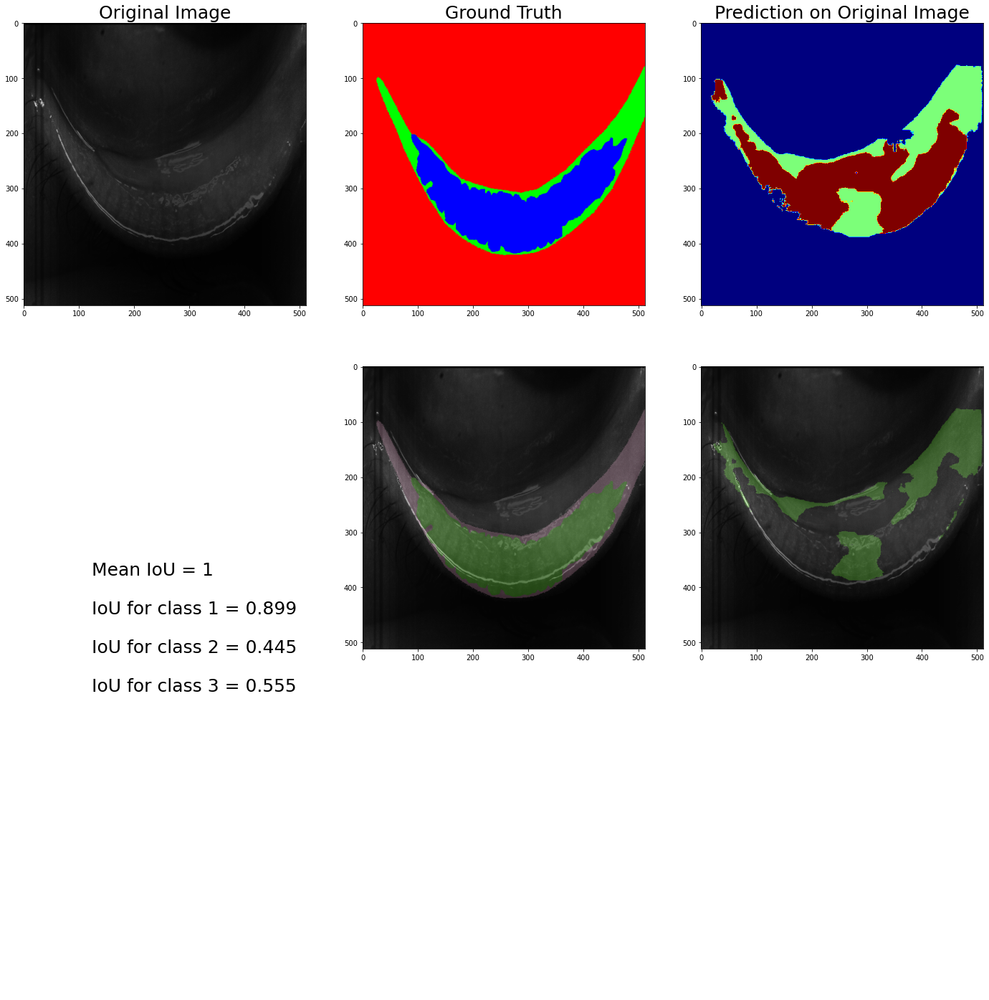

Unique values for the below prediction:
 [[     0 198348]
 [     1  25596]
 [     2  38200]]
Mean IoU = 0.629
Below is prediction_7


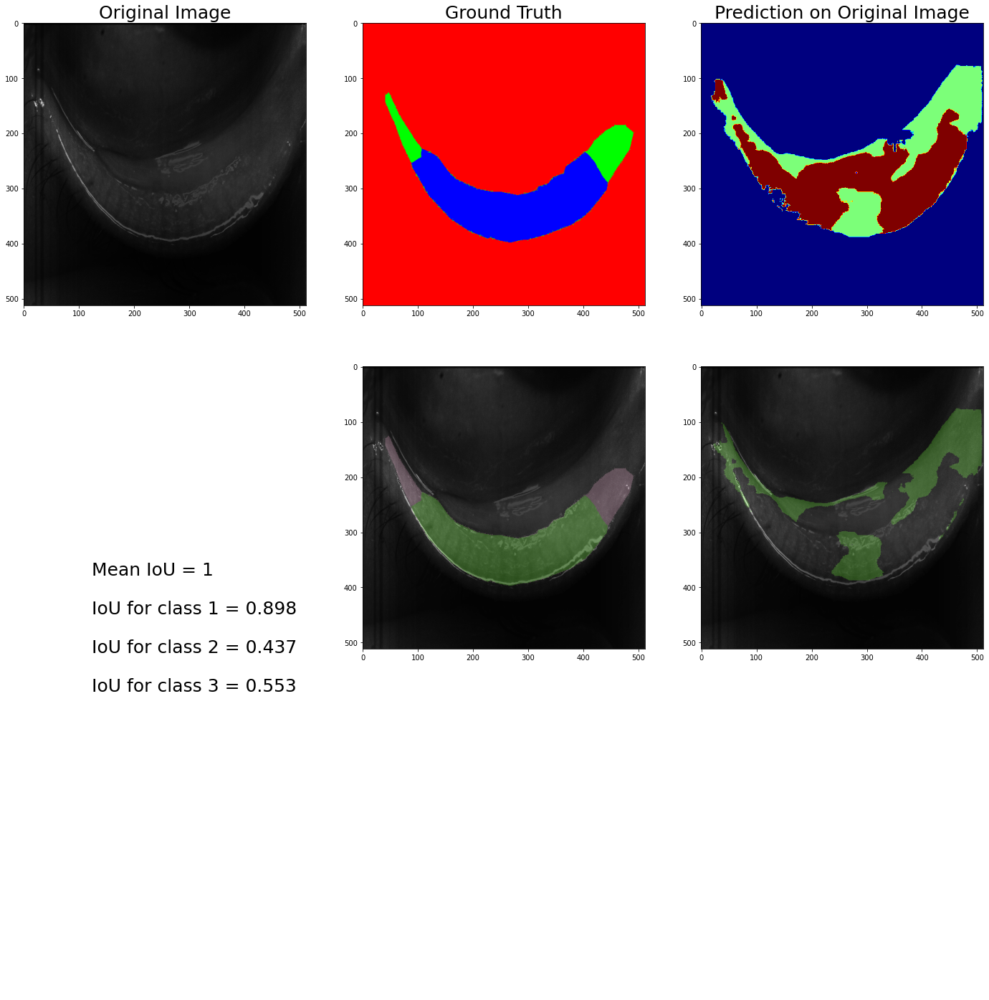

Unique values for the below prediction:
 [[     0 198348]
 [     1  25596]
 [     2  38200]]
Mean IoU = 0.627
Below is prediction_8


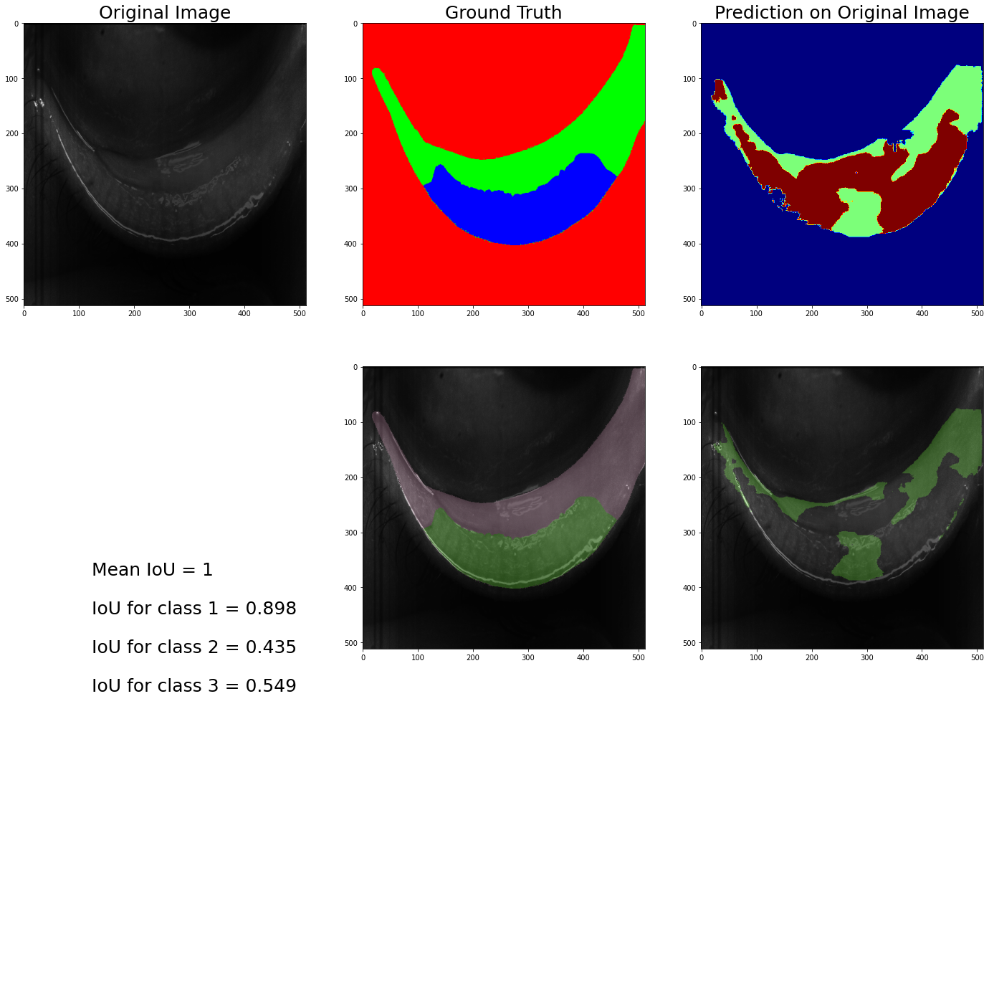

Unique values for the below prediction:
 [[     0 213390]
 [     1  12766]
 [     2  35988]]
Mean IoU = 0.627
Below is prediction_9


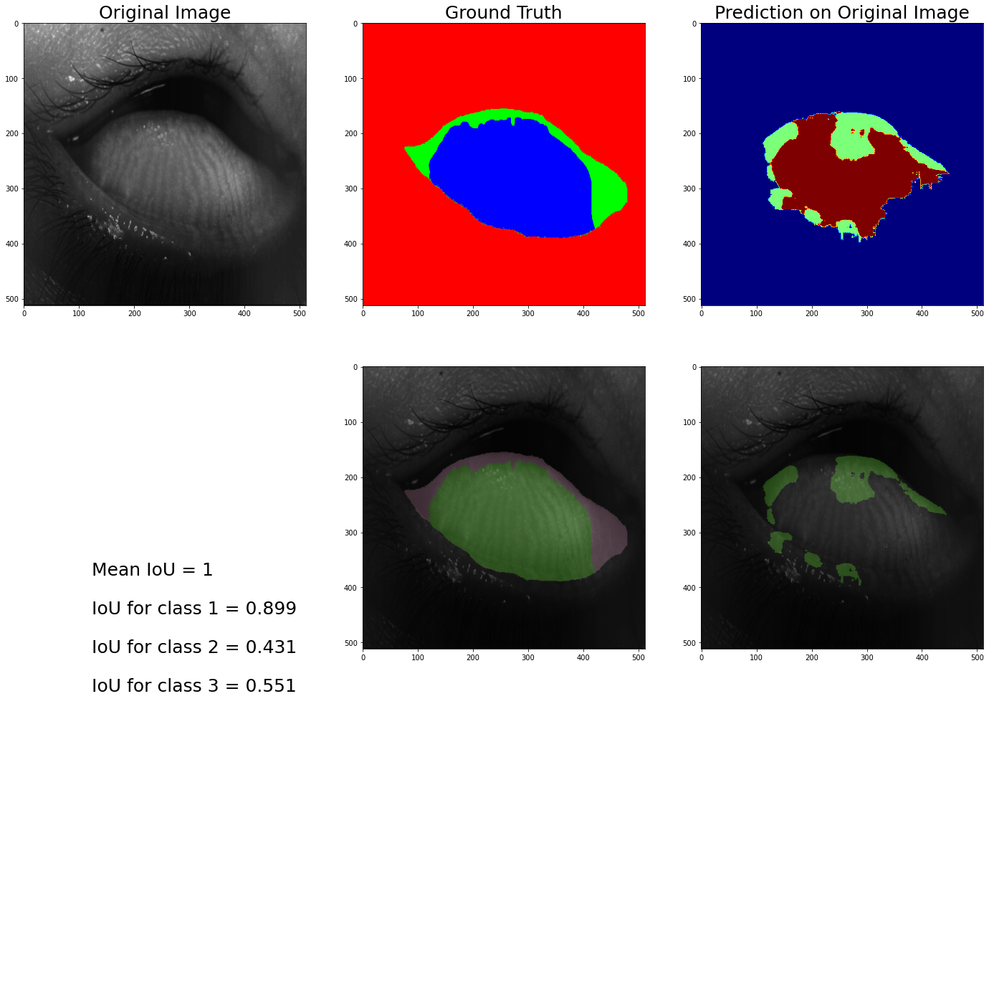

Unique values for the below prediction:
 [[     0 213390]
 [     1  12766]
 [     2  35988]]
Mean IoU = 0.627
Below is prediction_10


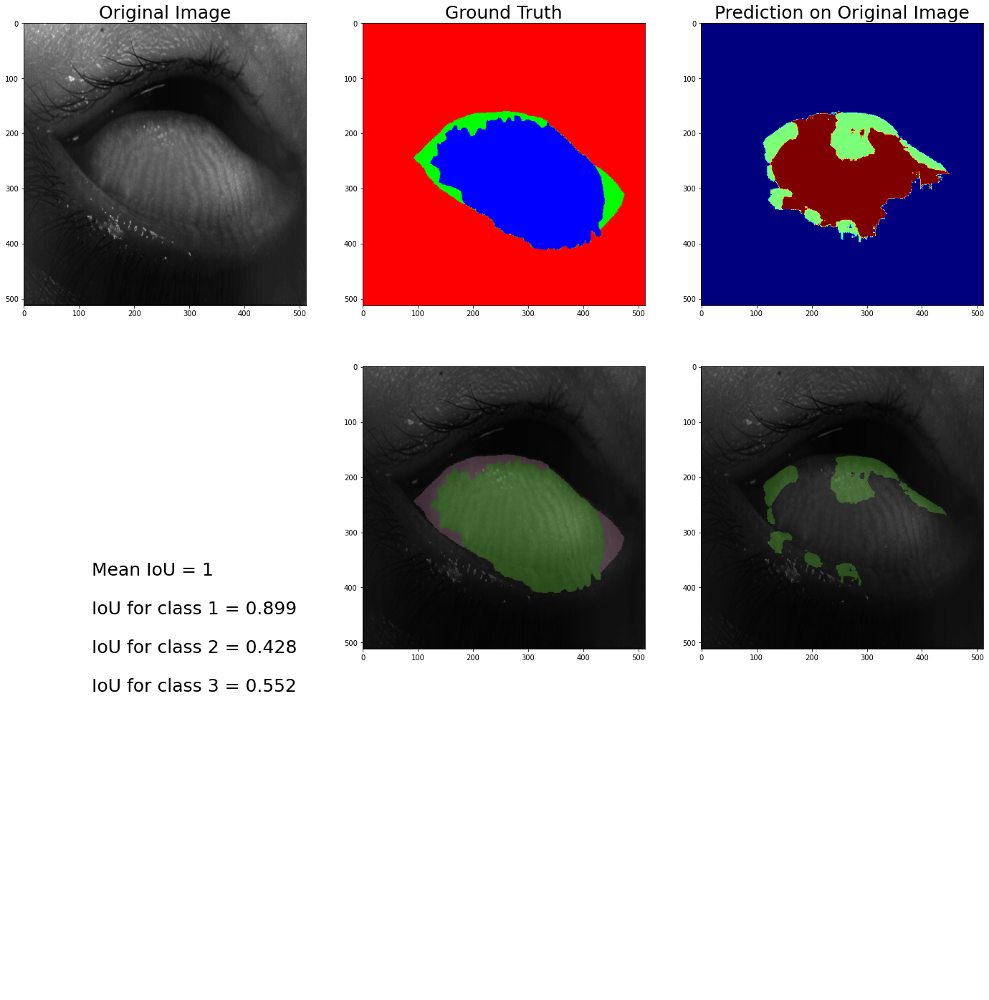

Unique values for the below prediction:
 [[     0 213390]
 [     1  12766]
 [     2  35988]]
Mean IoU = 0.625
Below is prediction_11


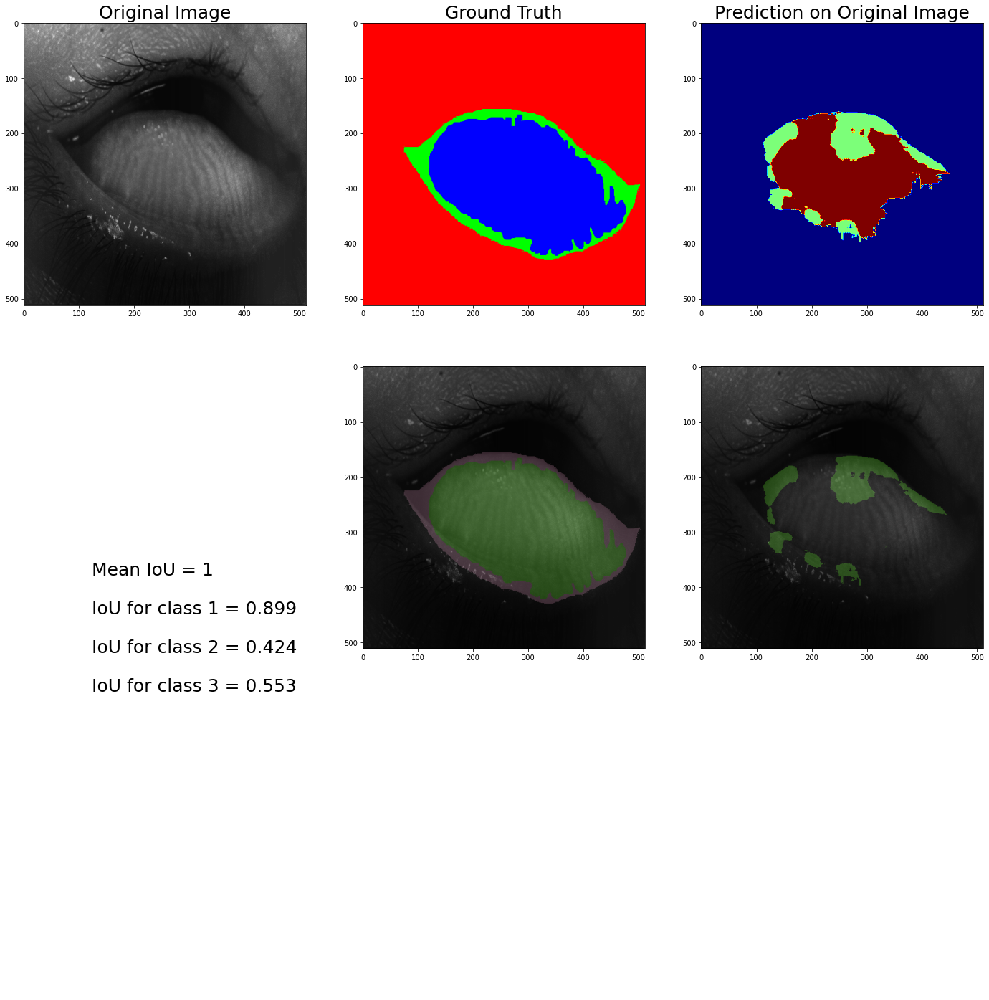

Unique values for the below prediction:
 [[     0 227434]
 [     1  13100]
 [     2  21610]]
Mean IoU = 0.625
Below is prediction_12


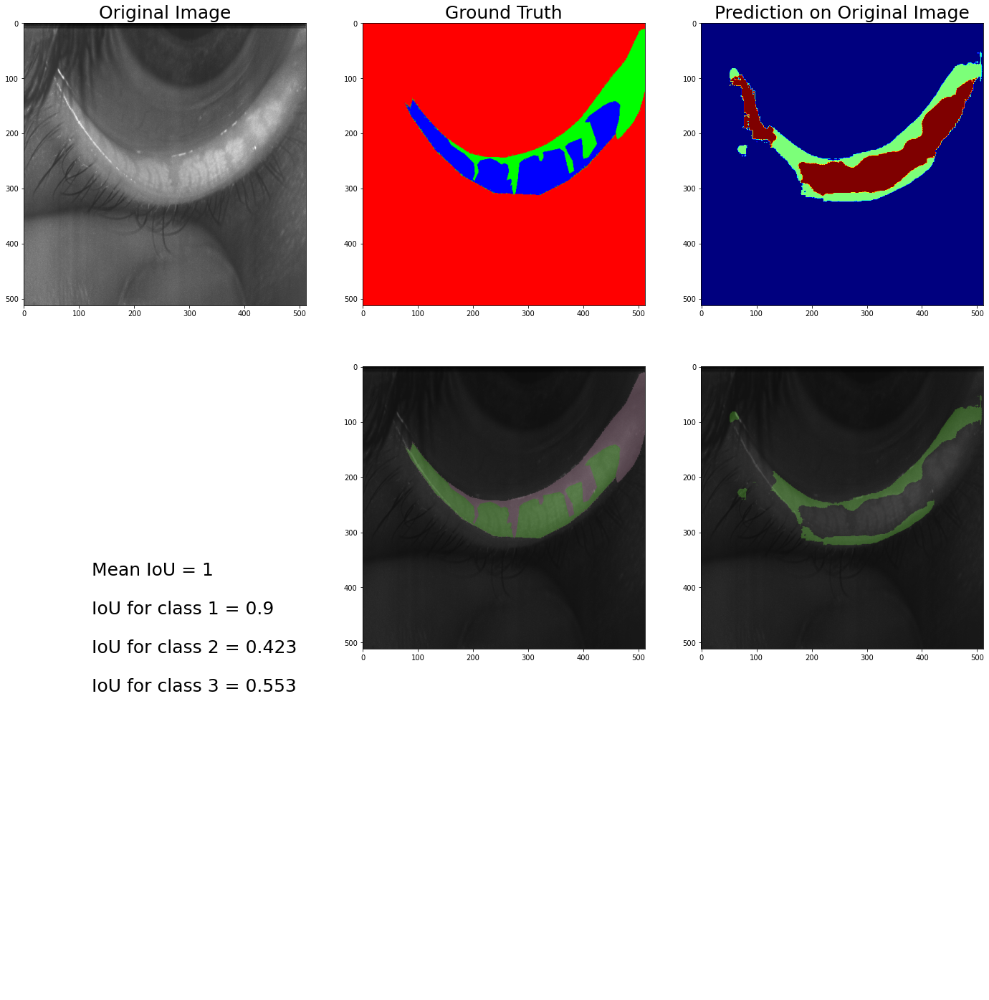

Unique values for the below prediction:
 [[     0 227434]
 [     1  13100]
 [     2  21610]]
Mean IoU = 0.625
Below is prediction_13


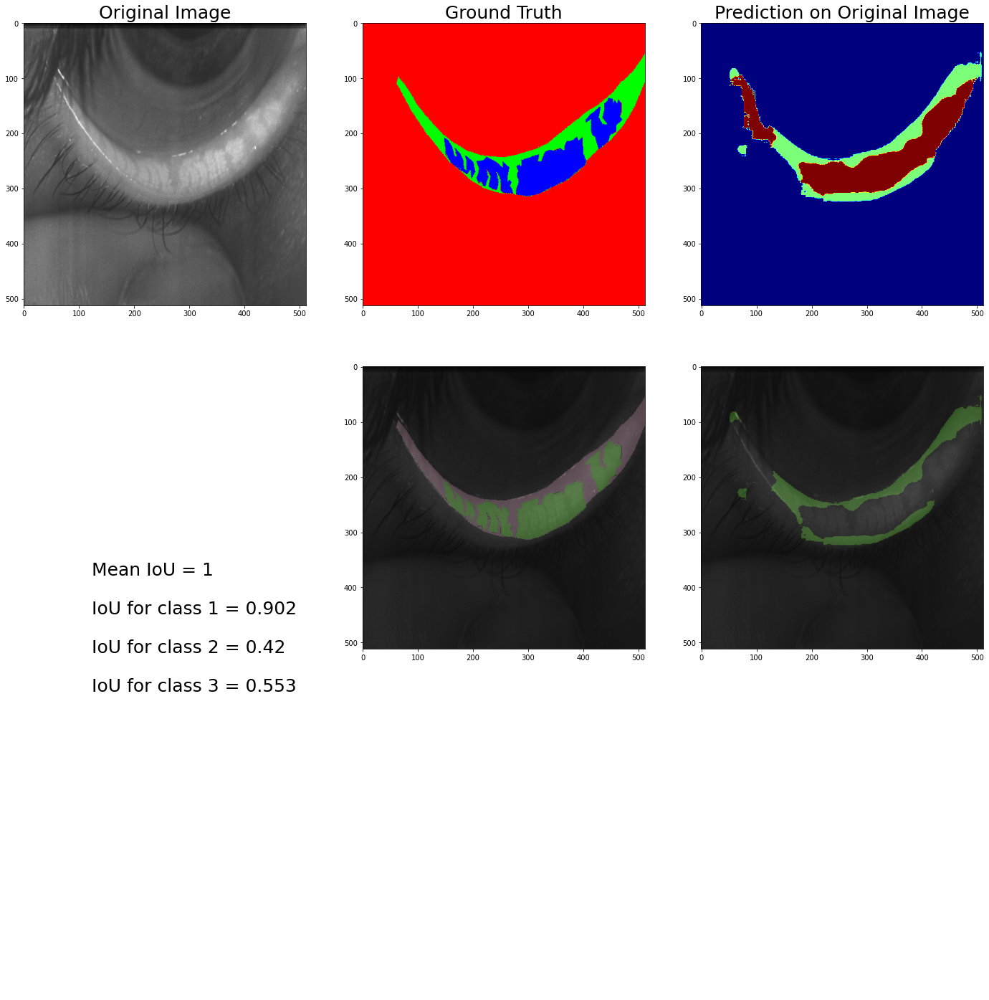

Unique values for the below prediction:
 [[     0 227434]
 [     1  13100]
 [     2  21610]]
Mean IoU = 0.625
Below is prediction_14


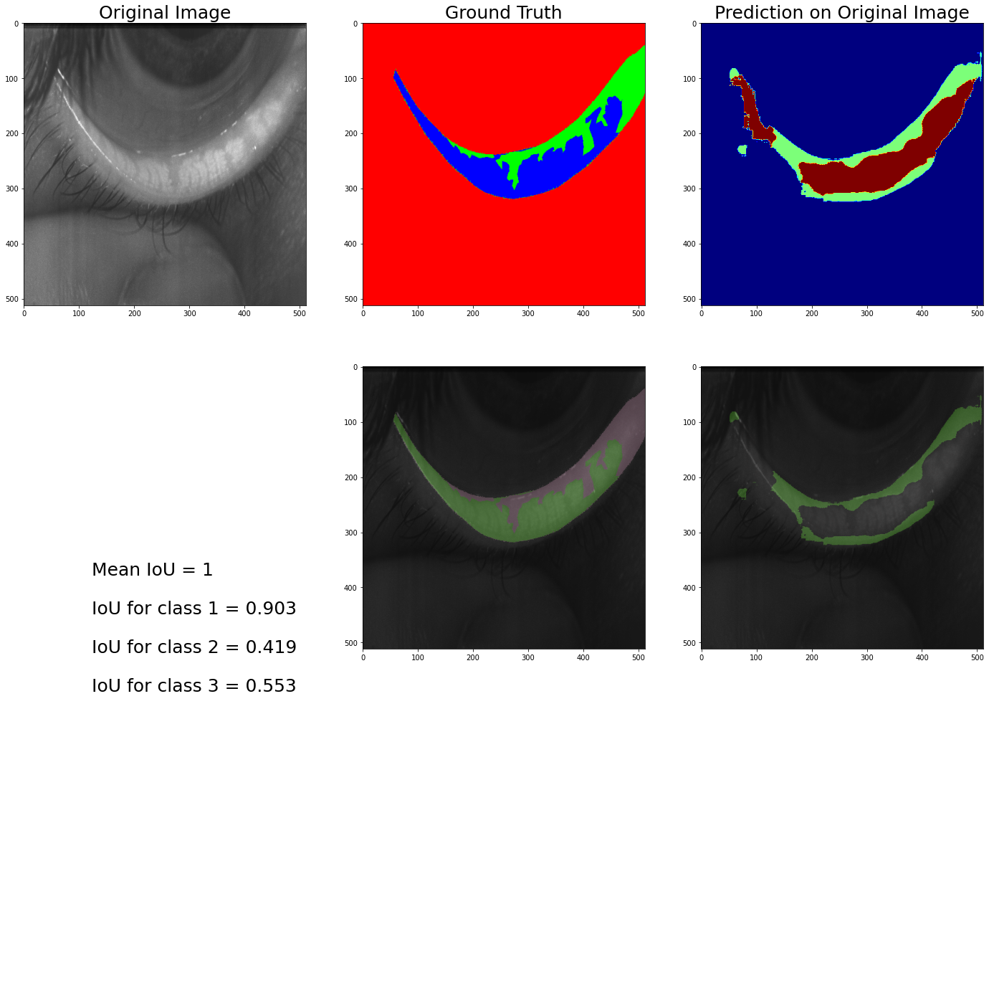

Unique values for the below prediction:
 [[     0 179910]
 [     1  33849]
 [     2  48385]]
Mean IoU = 0.628
Below is prediction_15


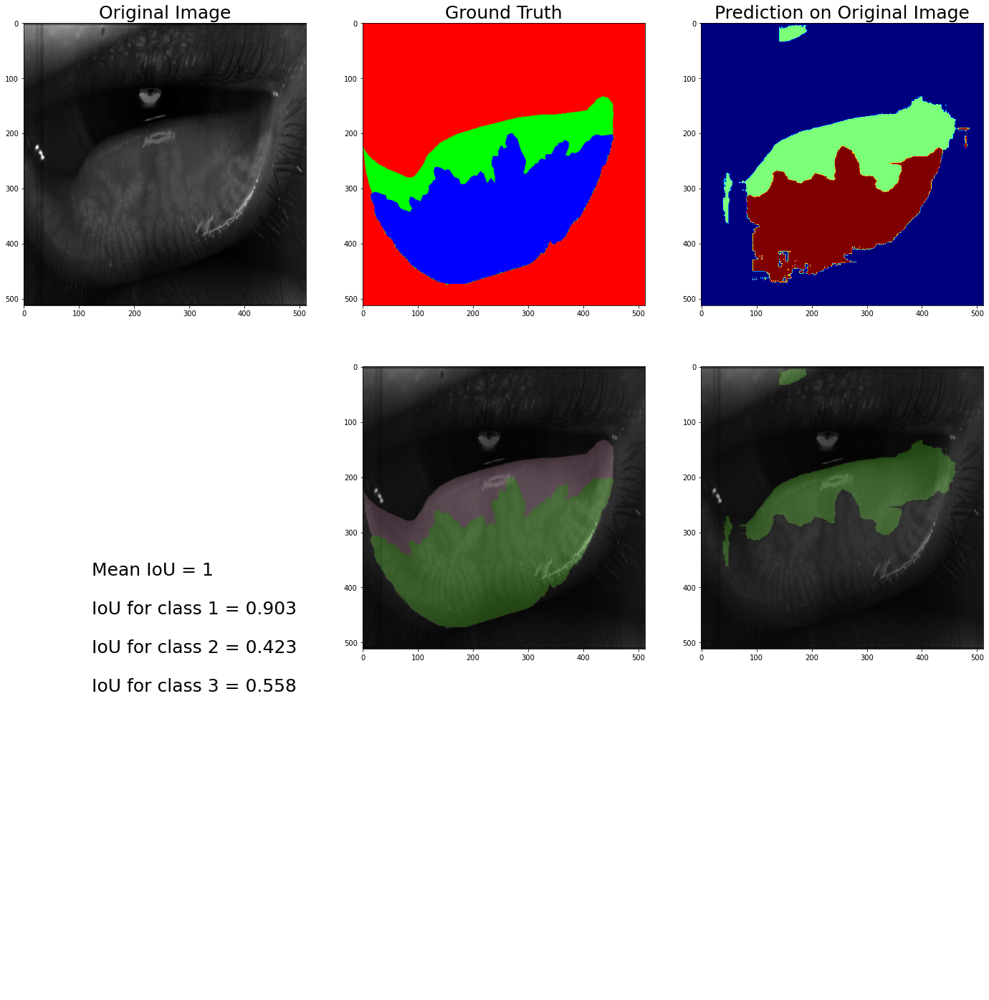

Unique values for the below prediction:
 [[     0 179910]
 [     1  33849]
 [     2  48385]]
Mean IoU = 0.631
Below is prediction_16


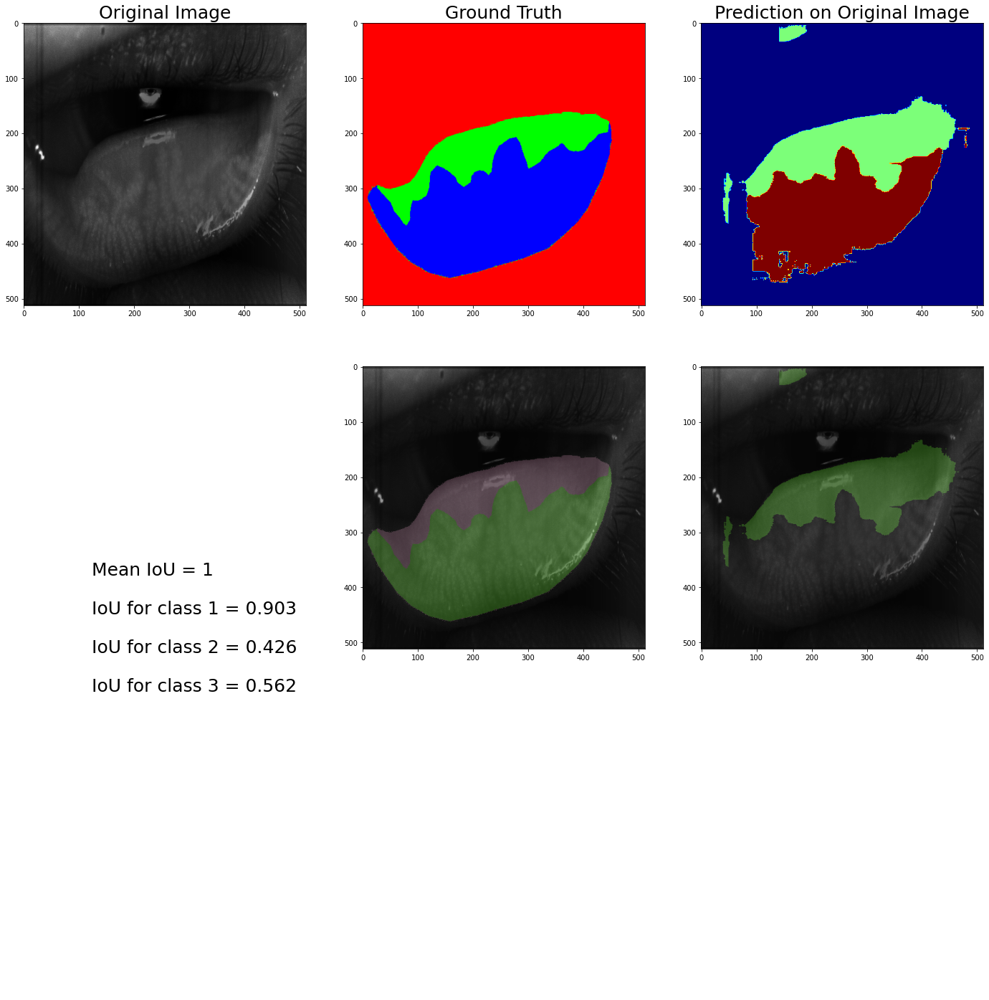

Unique values for the below prediction:
 [[     0 179910]
 [     1  33849]
 [     2  48385]]
Mean IoU = 0.632
Below is prediction_17


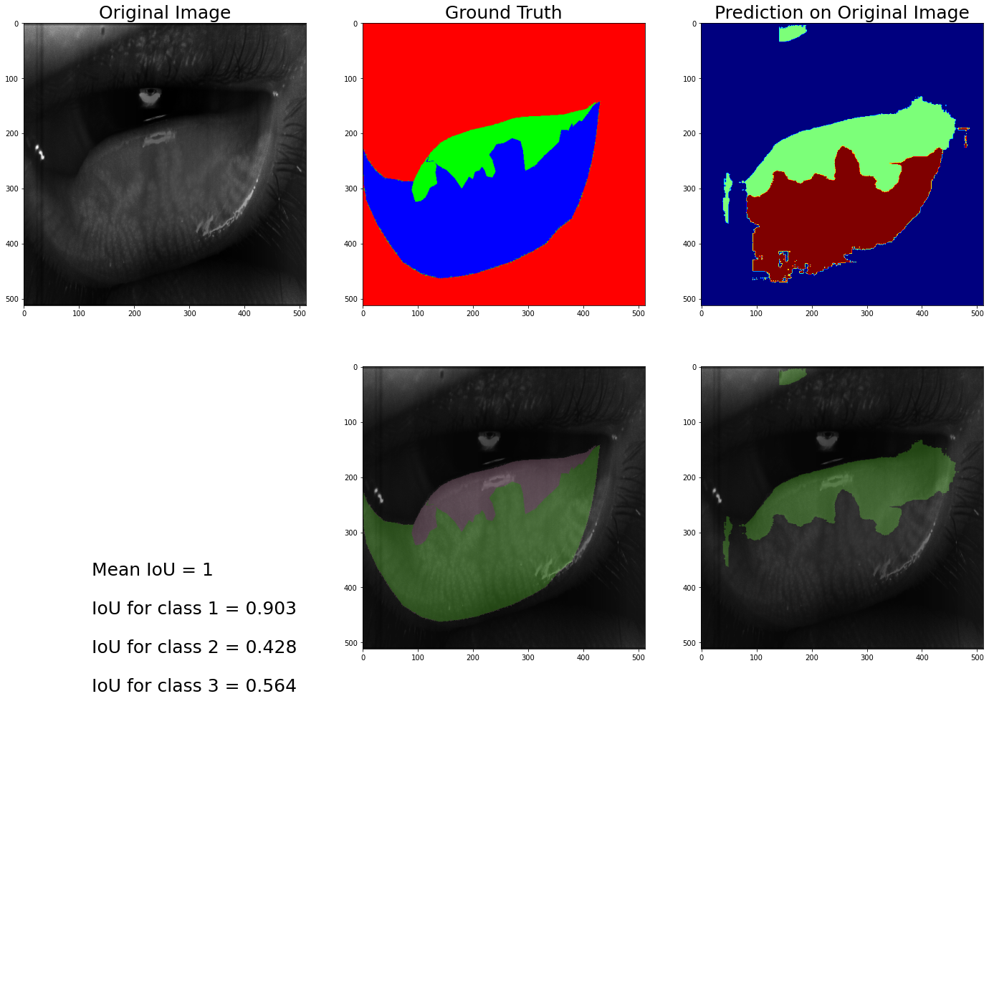

Unique values for the below prediction:
 [[     0 187863]
 [     1  11346]
 [     2  62935]]
Mean IoU = 0.633
Below is prediction_18


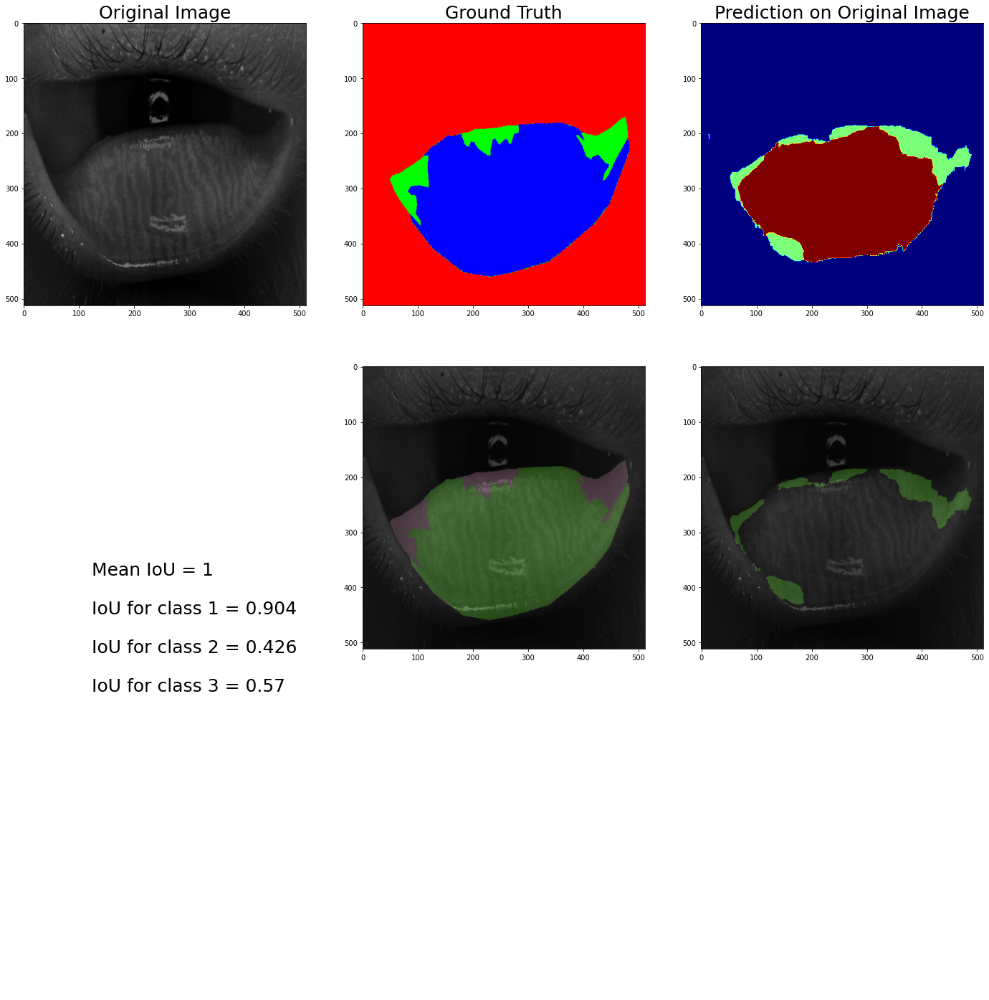

Unique values for the below prediction:
 [[     0 187863]
 [     1  11346]
 [     2  62935]]
Mean IoU = 0.635
Below is prediction_19


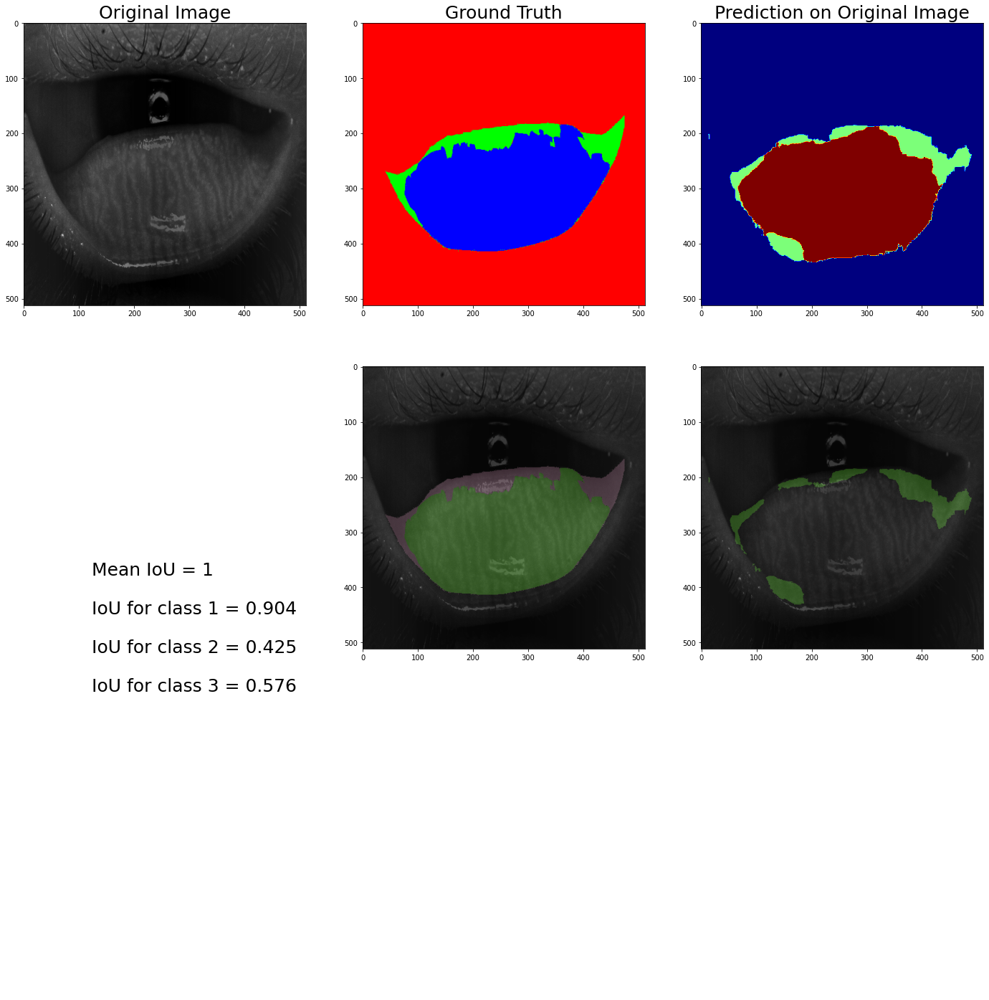

Unique values for the below prediction:
 [[     0 187863]
 [     1  11346]
 [     2  62935]]
Mean IoU = 0.636
Below is prediction_20


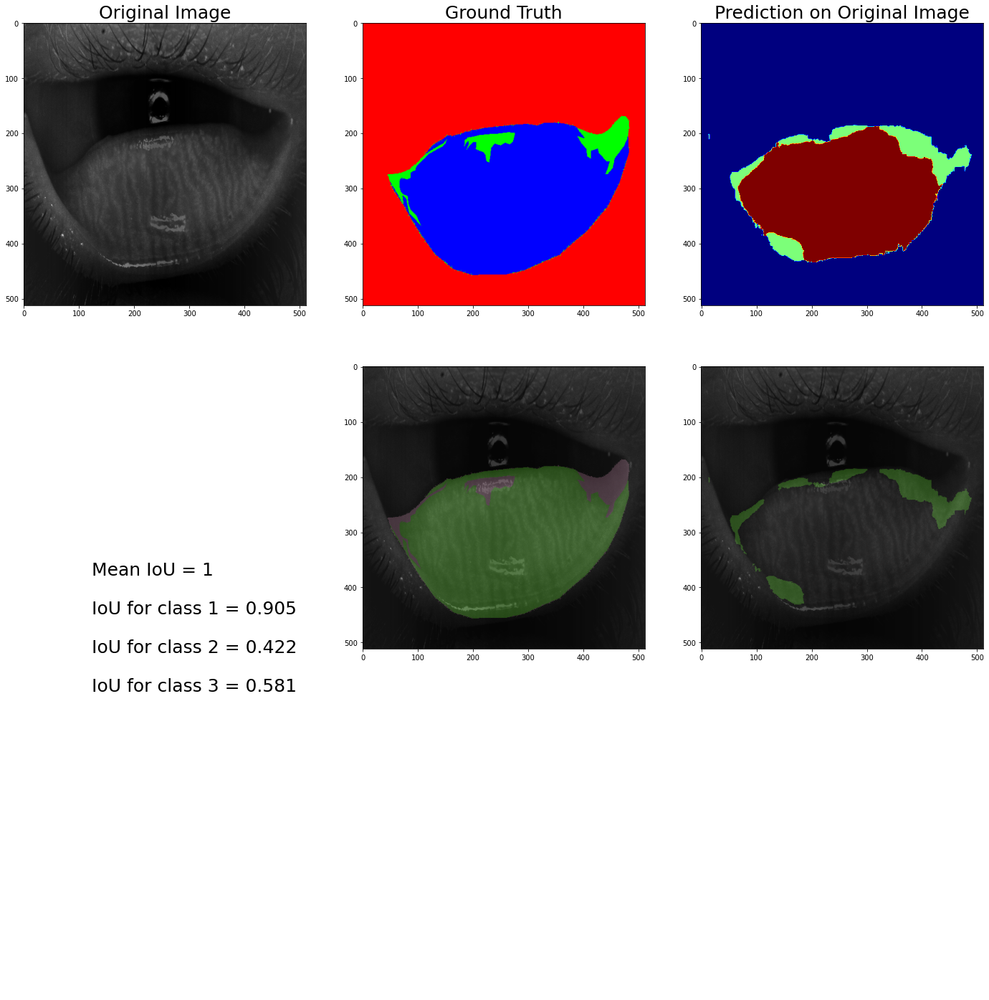

Unique values for the below prediction:
 [[     0 223217]
 [     1   6704]
 [     2  32223]]
Mean IoU = 0.636
Below is prediction_21


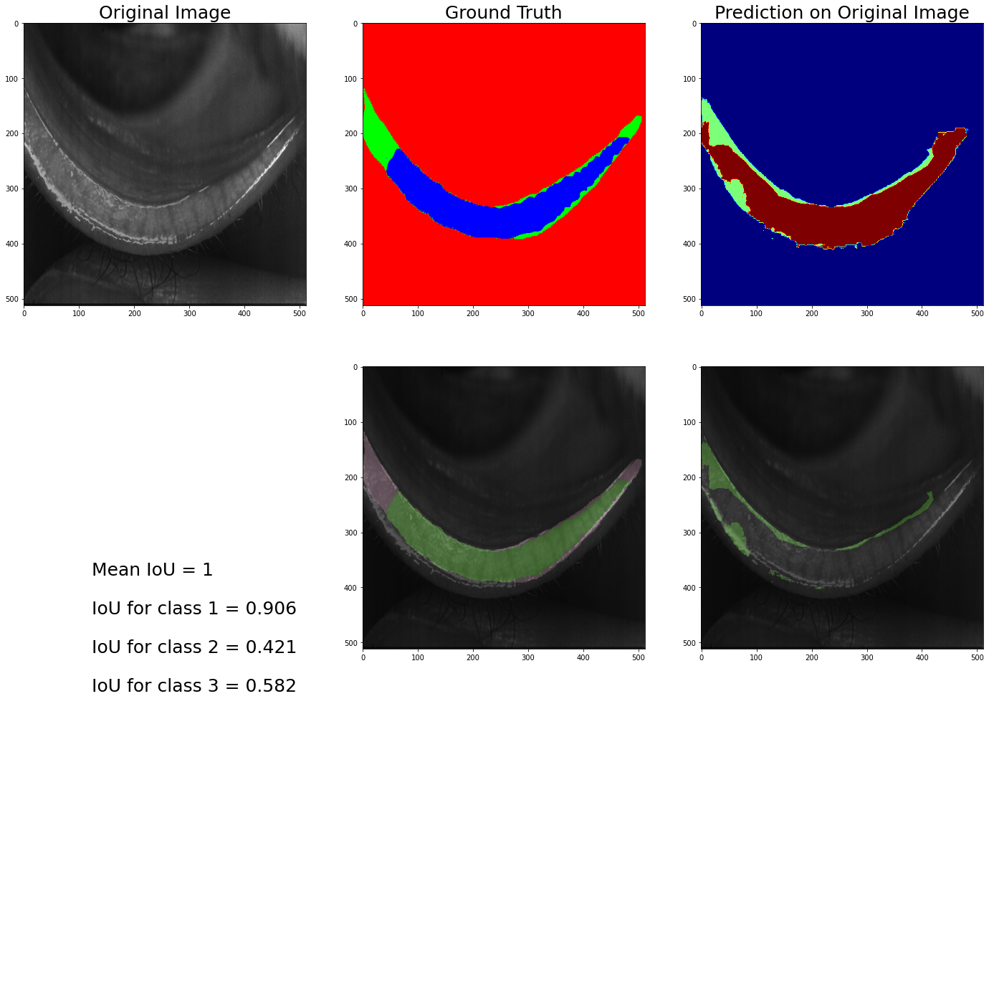

Unique values for the below prediction:
 [[     0 223217]
 [     1   6704]
 [     2  32223]]
Mean IoU = 0.636
Below is prediction_22


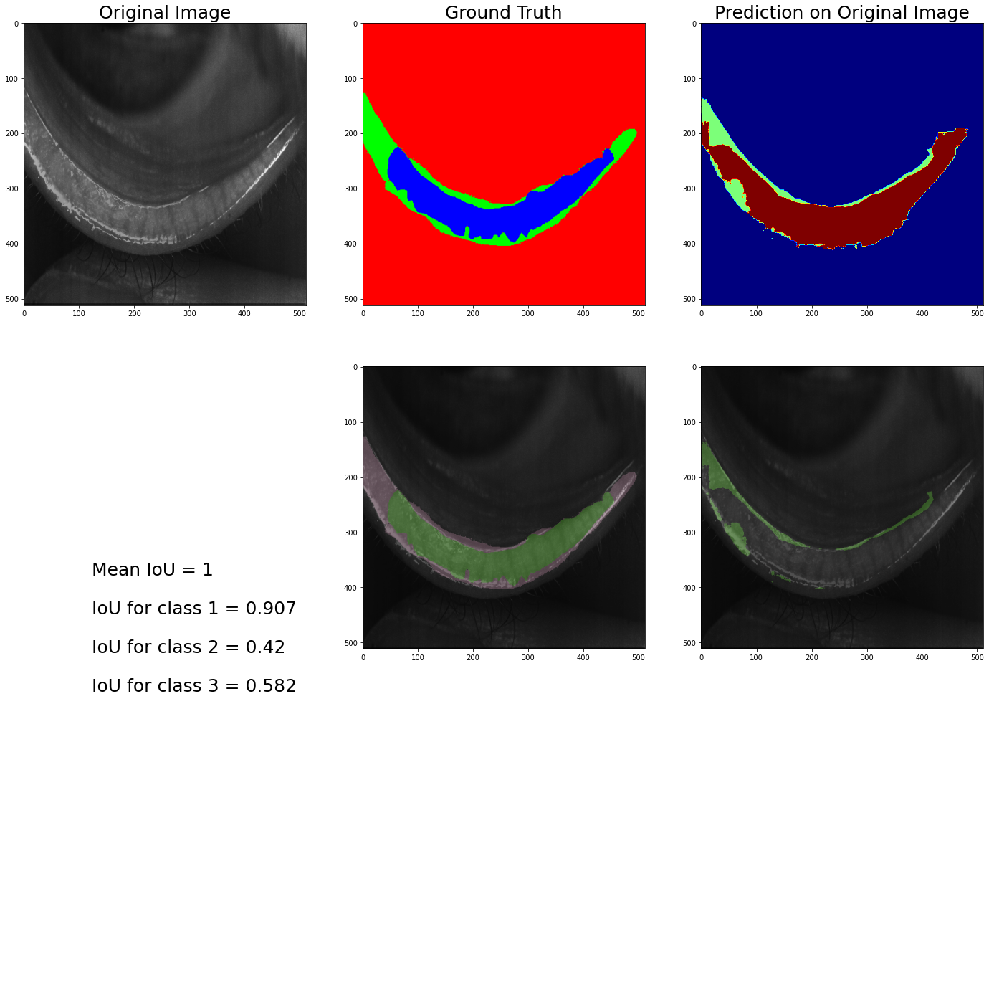

Unique values for the below prediction:
 [[     0 223217]
 [     1   6704]
 [     2  32223]]
Mean IoU = 0.637
Below is prediction_23


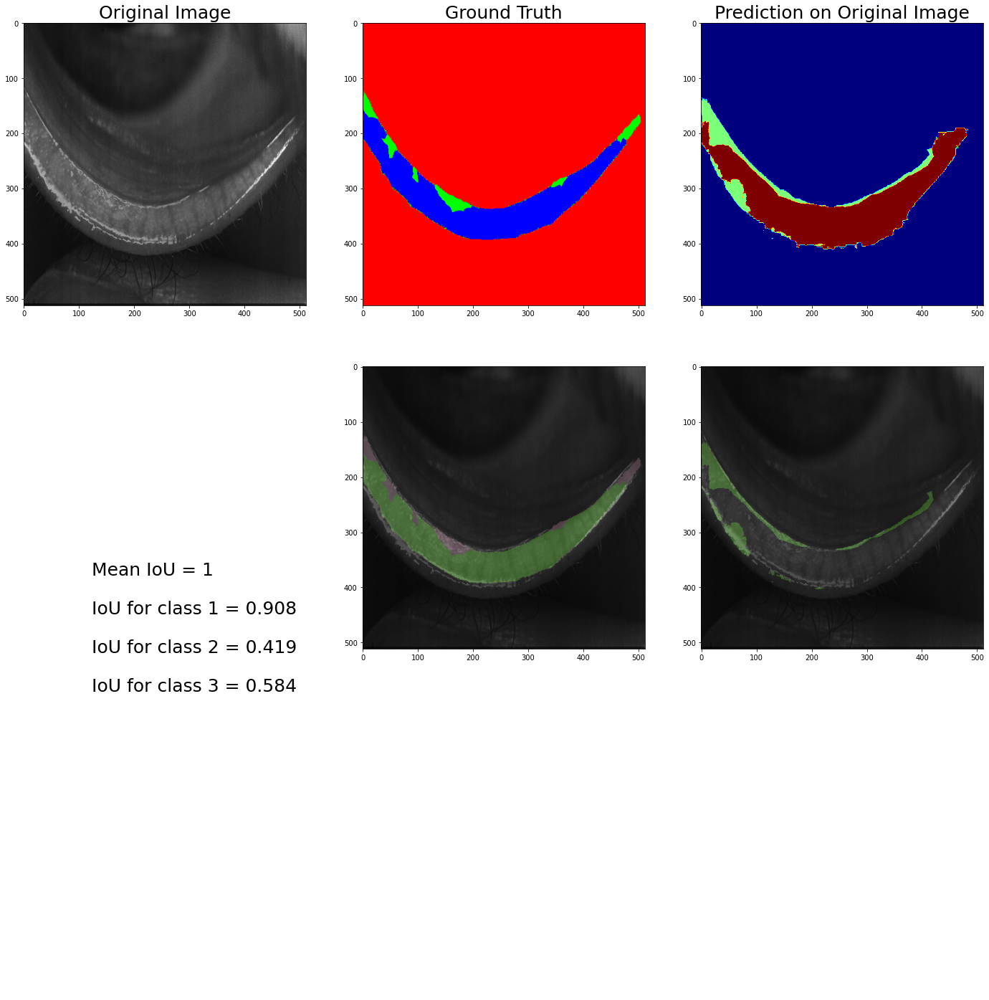

Unique values for the below prediction:
 [[     0 212358]
 [     1  11385]
 [     2  38401]]
Mean IoU = 0.637
Below is prediction_24


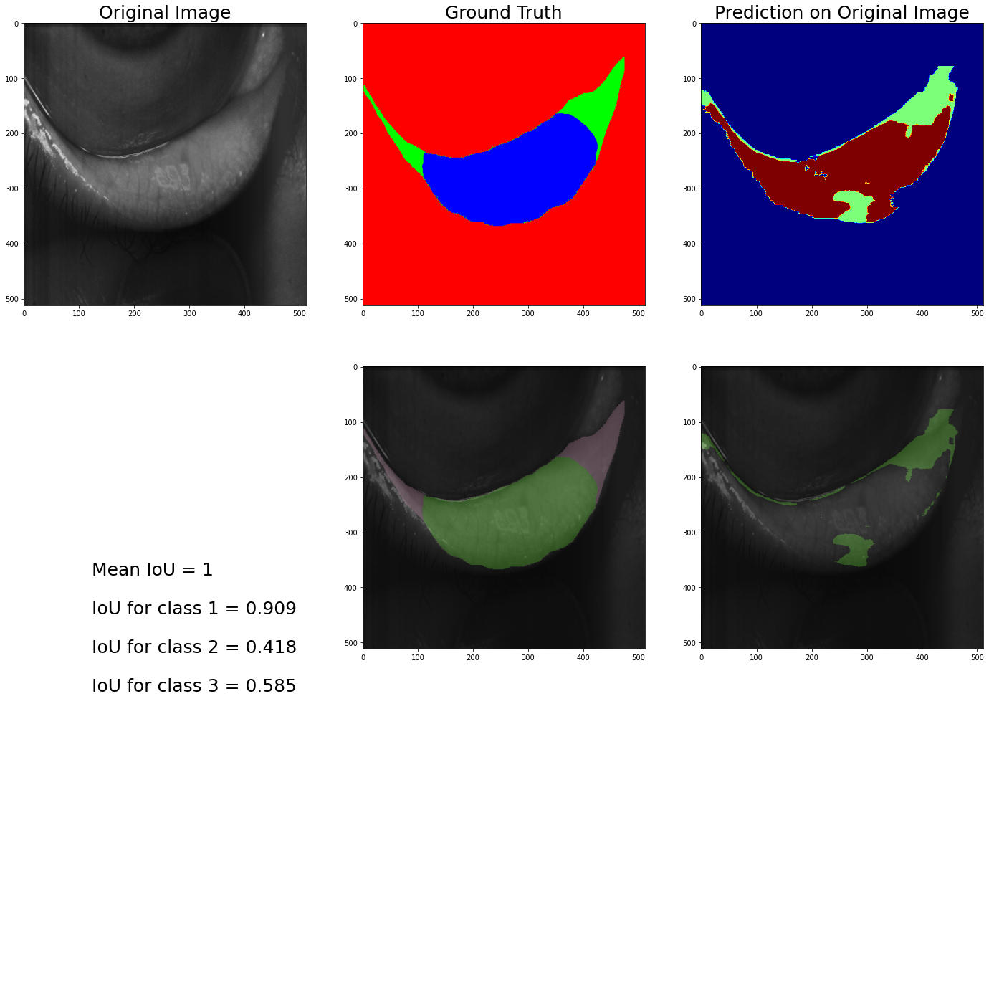

Unique values for the below prediction:
 [[     0 212358]
 [     1  11385]
 [     2  38401]]
Mean IoU = 0.638
Below is prediction_25


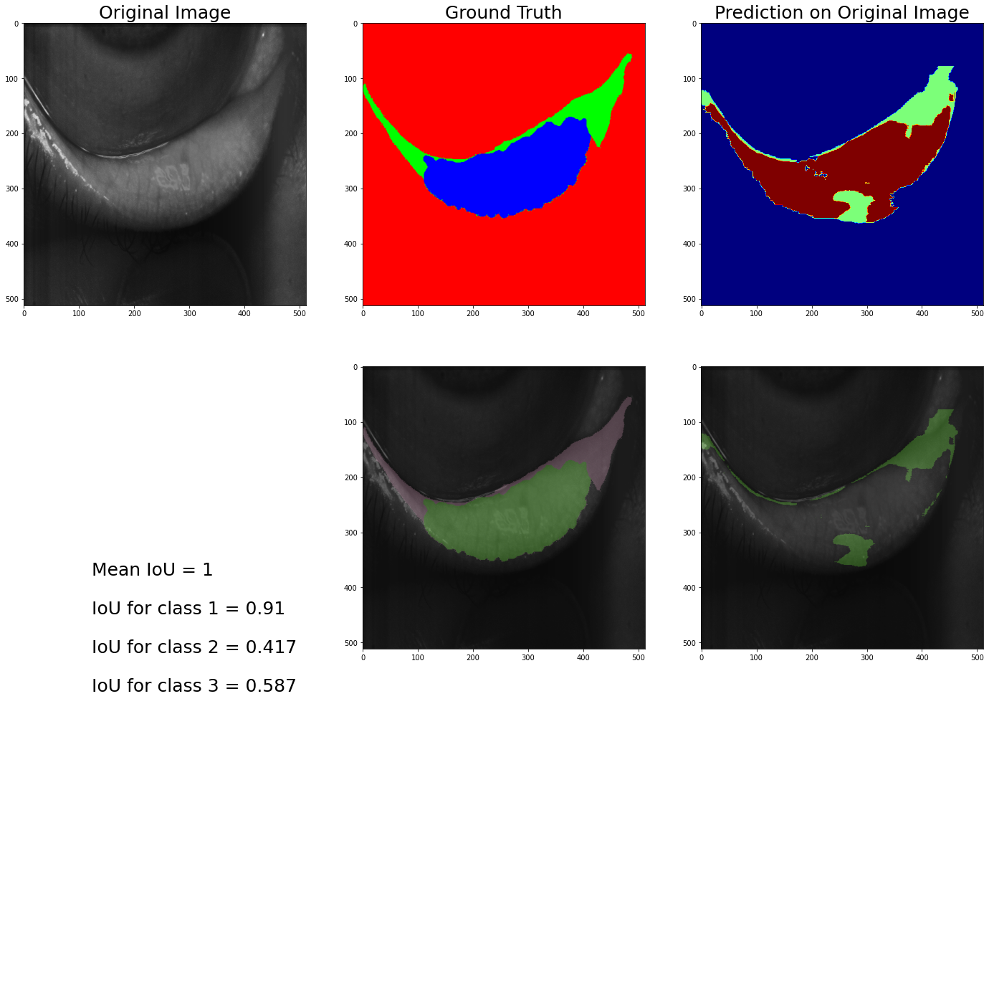

Unique values for the below prediction:
 [[     0 212358]
 [     1  11385]
 [     2  38401]]
Mean IoU = 0.637
Below is prediction_26


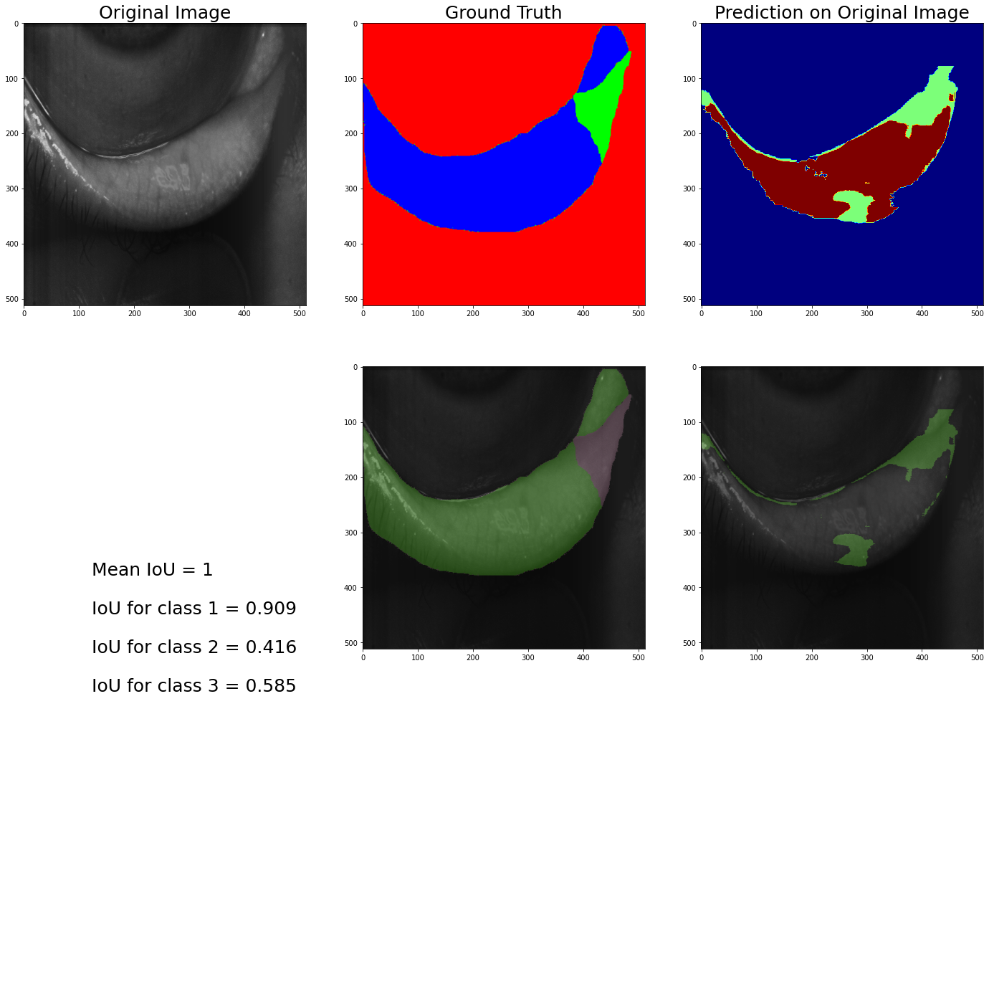

Unique values for the below prediction:
 [[     0 185837]
 [     1  42627]
 [     2  33680]]
Mean IoU = 0.632
Below is prediction_27


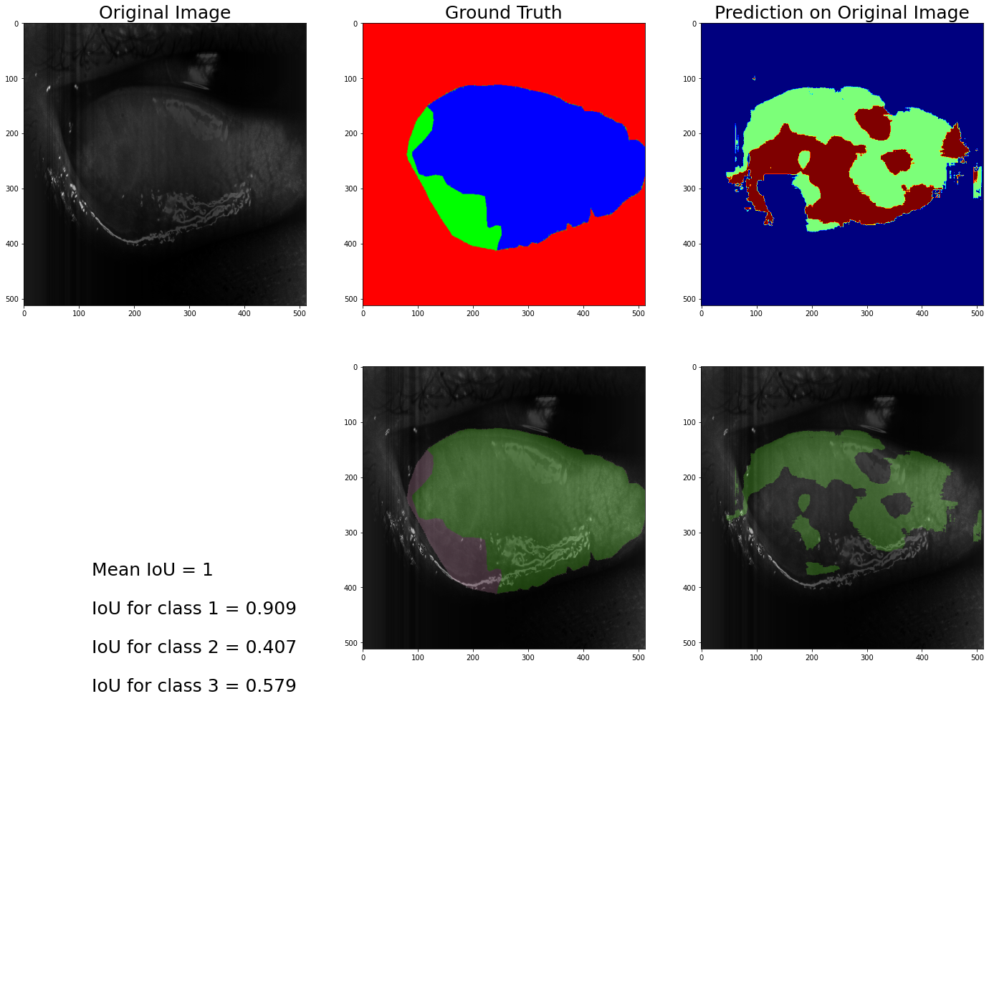

Unique values for the below prediction:
 [[     0 185837]
 [     1  42627]
 [     2  33680]]
Mean IoU = 0.627
Below is prediction_28


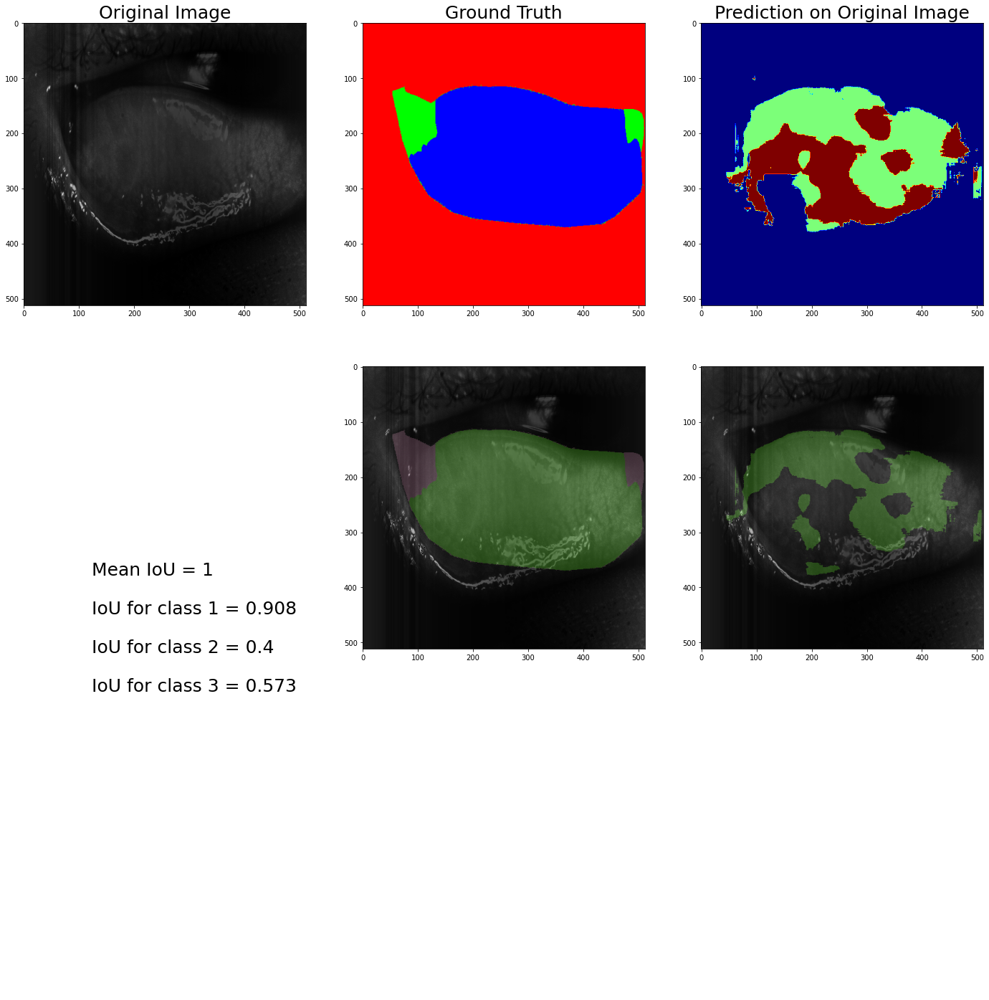

In [76]:
# for i in range(0, 28): # for v0.2
for i in range(0, 29):
    test_img_number = i
    test_img = X_test3[test_img_number]
    ground_truth=y_test4[test_img_number]
    ground_truth2 = ground_truth.astype(int)
    test_img_norm=test_img[:,:,0][:,:,None]
    test_img_input=np.expand_dims(test_img_norm, 0)
    prediction = (model.predict(test_img_input))
    predicted_img=np.argmax(prediction, axis=3)[0,:,:]
    
    # Calculating loss -------------------------------------------------
    ground_truth2=np.argmax(ground_truth, axis=2)[:,:]
#     print("ground_truth:", ground_truth)
#     print('test_img.shape:', test_img.shape)
#     print('ground_truth.shape:', ground_truth.shape)
#     print('ground_truth2.shape:', ground_truth2.shape)
#     print('test_img_norm.shape:', test_img_norm.shape)
#     print('test_img_input.shape:', test_img_input.shape)
#     print('prediction.shape:', prediction.shape)
#     print('predicted_img.shape:', predicted_img.shape)
#     print(predicted_img)
    
    ### use this for atrophied glands --------------------------------------------------------------------------
    # Print unique values of the ground truth
    background = np.sum(ground_truth[:,:,0]==1)
    eyelid = np.sum(ground_truth[:,:,1]==1)
    glands = np.sum(ground_truth[:,:,2]==1)
#     print('ind0:', ind0)
#     print('ind1:', ind1)
#     print('ind2:', ind2)
    # Calculate gland loss
    atrophy_g = (eyelid/(eyelid+glands)) * 100
    atrophy_g = round(atrophy_g, 2)
#     print("Gland loss for the below ground truth: {}%".format(atrophy_g))
    scatter_ground_x = np.append(scatter_ground_x, atrophy_g) # Append to numpy array to create a scatter plot
    
    # Print unique values of the prediction
    (unique,counts)=np.unique(predicted_img,return_counts=True)
    frequencies = np.asarray((unique, counts)).T
    print("Unique values for the below prediction:\n", frequencies)
#     # Calculate gland loss
    eyelid = frequencies[1,1]
    glands = frequencies[2,1]
#     eyelid = frequencies[0,1]
#     glands = frequencies[1,1]
    atrophy_p = (eyelid/(eyelid+glands)) * 100
    atrophy_p = round(atrophy_p, 2)
#     print("Gland loss for the below prediction: {}%".format(atrophy_p))
    scatter_pred_y = np.append(scatter_pred_y, atrophy_p) # Append to numpy array to create a scatter plot
    ### ------------------------------------------------------------------------------------------------------
    
#     plt.hist(predicted_img.flat, bins=100, range=(0,5))
    
#     plt.figure(figsize=(12, 24))
#     plt.figure(figsize=(24, 16))
    plt.figure(figsize=(24, 25))

#     plt.subplot(231)
    plt.subplot(3,3,1)
    plt.title('Original Image',fontsize=25)
    test_img = cv2.resize(test_img[:,:,0], (new_width, new_height))
    plt.imshow(test_img, cmap='gray')

#     plt.subplot(232)
    plt.subplot(3,3,2)
    plt.title('Ground Truth',fontsize=25)
    ground_truth = cv2.resize(ground_truth, (new_width, new_height))
    ground_truth_img=np.argmax(ground_truth, axis=2)[:,:]
    plt.imshow(ground_truth, cmap='jet')
    
#     plt.subplot(233)
    plt.subplot(3,3,3)
    plt.title('Prediction on Original Image',fontsize=25)
    predicted_img = predicted_img.reshape((new_width, new_height)).astype('float32')
    predicted_img = cv2.resize(predicted_img, (new_width, new_height))
    plt.imshow(predicted_img, cmap='jet')
    
#     For erosion ----------------------------------------------------------------------
#     kernel = np.ones((3,3), np.uint8)
#     if (i >= 20) and (i <= 24):
#         predicted_img = cv2.erode(predicted_img, kernel, iterations=5)
#     else:
#         predicted_img = cv2.erode(predicted_img, kernel, iterations=3)
#   ------------------------------------------------------------------------------------
     
#     (unique,counts)=np.unique(predicted_img,return_counts=True)
#     frequencies = np.asarray((unique, counts)).T
#     frequencies = frequencies.astype(int)
#     print(frequencies)
    

    # Save predictions
#     filename = '/data/Unet_data/prediction_y_29/prediction_{}.jpg'.format(i)
#     cv2.imwrite(filename, predicted_img)

    # For some reason, images turned dark, so I multiplied higher values to make them brighter.
#     predicted_img[predicted_img==1] = 150
#     predicted_img[predicted_img==2] = 255
    predicted_img[predicted_img==1] = 255
    
    # Save predictions
#     filename = '/data/Unet_data/prediction_y_29/prediction_{}.jpg'.format(i)
#     cv2.imwrite(filename, predicted_img)
    
    test_img *= 1000
    ground_truth_img[ground_truth_img==1] = 900
    ground_truth_img[ground_truth_img==2] = 1000
#     predicted_img[predicted_img>1.5] = 1000
#     predicted_img[(predicted_img>0.5)&(predicted_img<=1.5)] = 900
#     predicted_img[predicted_img<=0.5] = 0
    
    predicted_img[predicted_img==255] = 1000
    predicted_img[predicted_img==150] = 900

    test_img = Image.fromarray(test_img.astype(np.uint8))
    ground_truth_img = Image.fromarray(ground_truth_img.astype(np.uint8))
    predicted_img = Image.fromarray(predicted_img.astype(np.uint8))
    
    test_img = test_img.convert("RGBA")
    ground_truth_img = ground_truth_img.convert("RGB")
    predicted_img = predicted_img.convert("RGB")

    #---------------------------------------------------------------------------------
    # Change overlaying predictions and annotations to color
    b, g, r = cv2.split(np.array(predicted_img))
    np.multiply(b, 1.5, out=b, casting="unsafe")
    np.multiply(g, 1.0, out=g, casting="unsafe")
    np.multiply(r, 1.25, out=r, casting="unsafe")

    predicted_img = cv2.merge([b, g, r])
    predicted_img = Image.fromarray(predicted_img.astype(np.uint8))
    predicted_img = predicted_img.convert("RGBA")
    
    b, g, r = cv2.split(np.array(ground_truth_img))
    np.multiply(b, 1.5, out=b, casting="unsafe")
    np.multiply(g, 1.0, out=g, casting="unsafe")
    np.multiply(r, 1.25, out=r, casting="unsafe")

    ground_truth_img = cv2.merge([b, g, r])
    ground_truth_img = Image.fromarray(ground_truth_img.astype(np.uint8))
    ground_truth_img = ground_truth_img.convert("RGBA")
    #---------------------------------------------------------------------------------
    ### Plot figures
    #     ground_truth_img.putalpha(500)
#     predicted_img.putalpha(500)

    # change number(0.25) for different transparencies
#     groundtruth_overlay = Image.blend(test_img, ground_truth_img, 0.25)
    predicted_overlay = Image.blend(test_img, predicted_img, 0.25)
#     display(groundtruth_overlay, predicted_overlay)
    plt.subplot(3,3,5)
#     predicted_img = cv2.resize(np.array(groundtruth_overlay), (new_width, new_height))
    groundtruth_overlay = Image.blend(test_img, ground_truth_img, 0.25)
    plt.imshow(groundtruth_overlay)
    
    plt.subplot(3,3,6)
    predicted_img = cv2.resize(np.array(predicted_overlay), (new_width, new_height))
    plt.imshow(predicted_overlay)

   

    
#     plt.subplot(3,3,9)
#     fig, ax = plt.subplots()
#     draw.overlay_skeleton_2d(predicted_img, fil.skeleton_longpath, dilate=1, axes=ax)
    

    
#     # IoU for each prediction result---------------------------------------------------
    IOU_keras3.update_state(y_test3[i,:,:,0], y_pred_argmax3[i])
    mean_IoU = round(IOU_keras3.result().numpy(),3)
    print("Mean IoU =", mean_IoU)
    #To calculate IoU for each class...
    values = np.array(IOU_keras3.get_weights()).reshape(n_classes, n_classes)
    class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[1,0] + values[2,0])
    class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[0,1] + values[2,1])
    class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[0,2] + values[1,2])
    
    # Add IoUs
    plt.subplot(2,3,4)
    plt.axis('off')
    plt.gcf().text(0.18, 0.45, "Mean IoU = {}".format(round(mean_IoU), 3), fontsize=25)
    plt.gcf().text(0.18, 0.42, "IoU for class 1 = {}".format(round(class1_IoU,3)), fontsize=25)
    plt.gcf().text(0.18, 0.39, "IoU for class 2 = {}".format(round(class2_IoU,3)), fontsize=25)
    plt.gcf().text(0.18, 0.36, "IoU for class 3 = {}".format(round(class3_IoU,3)), fontsize=25)
    
    # % Print gland loss ------------------------------------------------------------
    ### use this for atrophied glands --------------------------------------------------------------------------
#     plt.gcf().text(0.11, 0.42, "Gland loss (ground truth) = {}%".format(round(atrophy_g, 3)), fontsize=22)
#     plt.gcf().text(0.13, 0.39, "Gland loss (prediction) = {}%".format(round(atrophy_p, 3)), fontsize=22)
#     plt.gcf().text(0.21, 0.33, "Difference = {}%p".format(round(abs(atrophy_g - atrophy_p), 3)), fontsize=22)
    ### ------------------------------------------------------------------------------------------------------
    # Save predictions
#     filename = '/data/Unet_data/prediction_y_29/prediction_{}.jpg'.format(i)
#     cv2.imwrite(filename, predicted_img)
# ----------------------------------------------------------------------------------------------------
    ### Measuring regionprops(major_axis_length & minor_axis_length)

#     regions = measure.regionprops(labeled_mask)
#     fig, ax = plt.subplots()
#     ax.imshow(predicted_img, cmap=plt.cm.gray)

#     for props in regions:
# #         if props['area'] > 100 and props['area'] < 1000:
#         if props['area'] > new_height * 0.39:
#             y0, x0 = props.centroid
#             orientation = props.orientation
#             x1 = x0 + math.cos(orientation) * 0.5 * props.minor_axis_length
#             y1 = y0 - math.sin(orientation) * 0.5 * props.minor_axis_length
#             x2 = x0 - math.sin(orientation) * 0.5 * props.major_axis_length
#             y2 = y0 - math.cos(orientation) * 0.5 * props.major_axis_length

#             ax.plot((x0, x1), (y0, y1), '-r', linewidth=1.5)
#             ax.plot((x0, x2), (y0, y2), '-r', linewidth=1.5)
#             ax.plot(x0, y0, '.w', markersize=6)

#             minr, minc, maxr, maxc = props.bbox
#             bx = (minc, maxc, maxc, minc, minc)
#             by = (minr, minr, maxr, maxr, minr)
#             ax.plot(bx, by, '-b', linewidth=0.8)

    
#     props = measure.regionprops_table(labeled_mask, predicted_img,
#                                      properties=['label', 'area', 'major_axis_length', 'minor_axis_length'])
# #     plt.imshow(label_image)
# #     plt.show()

#     df = pd.DataFrame(props)
#     df = df.sort_values(by='major_axis_length', ascending=False)
# #     print(df)
# #     df1 = df[(df['area'] > 100) & (df['area'] < 1000)]
#     df1 = df[(df['area'] > new_height * 0.39)] # new_height(512) * 0.39 = 199.68
# #     print('df1:',df1)
#     length = round(df1["major_axis_length"].median(),2)
#     print("major_axis_length median:", length)
#     width = round(df1["minor_axis_length"].median(),2)
#     print("minor_axis_length median:", width)
    
# -----------------------------------------------------------------------------------------------------
    print("Below is prediction_{}".format(i))
    
#     plt.savefig('/data/Unet_data/v0.3-atrophied-glands/result-overlaid/gland_loss{}_{}.jpg'.format(round(atrophy_p), i % 3))
    
    plt.show()

    # These arrays are for the Box-Whisker plot--------------------------------------
    array_m = np.append(array_m, mean_IoU)
    array_1 = np.append(array_1, class1_IoU)
    array_2 = np.append(array_2, class2_IoU)
    array_3 = np.append(array_3, class3_IoU) # for atrophied glands

#### Plot scatter plot for gland loss

ValueError: x and y must have same first dimension, but have shapes (61,) and (60,)

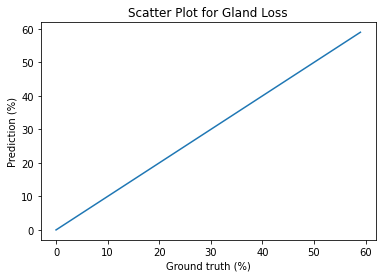

In [78]:
plt.plot(range(0,60))
plt.xlabel("Ground truth (%)")
plt.ylabel("Prediction (%)")
plt.title("Scatter Plot for Gland Loss")
# plt.scatter(scatter_ground_x, scatter_pred_y)
plt.plot(scatter_ground_x, scatter_pred_y, 'o')
## Linear regression
# m, b = np.polyfit(scatter_ground_x, scatter_pred_y, 1)
# plt.plot(scatter_ground_x, m * scatter_ground_x + b)
plt.show()

### 2.3 Creating a Box-Whisker plot for IoU from the above result

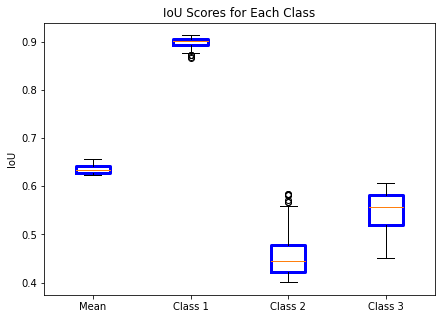

In [79]:
# Creating plot
fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bpm = ax.boxplot(array_m, positions=[1], widths=0.35, boxprops=boxprops1)
bp1 = ax.boxplot(array_1, positions=[2], widths=0.35, boxprops=boxprops1)
bp2 = ax.boxplot(array_2, positions=[3], widths=0.35, boxprops=boxprops1)
bp3 = ax.boxplot(array_3, positions=[4], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('IoU')
ax.set_xticklabels(['Mean', 'Class 1', 'Class 2', 'Class 3'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])

plt.title("IoU Scores for Each Class")
plt.show()

In [80]:
train_images3.shape

(30, 512, 512, 1)

In [81]:
# X_test3 = train_images3
# y_pred3=model.predict(X_test3)
# y_pred_argmax3=np.argmax(y_pred3, axis=3)

In [82]:
y_pred_argmax3.shape

(30, 512, 512)

In [83]:
y_pred3.shape

(30, 512, 512, 3)

In [84]:
y_test3.shape

(30, 512, 512, 1)

In [85]:
#Evaluate the model
	# evaluate model
_, acc = model.evaluate(X_test3, y_test_cat3)
print("Accuracy is = ", (acc * 100.0), "%")

1/1 [==============================] - 0s 84ms/step - loss: 0.3956 - accuracy: 0.8770
Accuracy is =  87.70245909690857 %


### 2.4 Calculating IoU on the 29 dataset

In [87]:
n_classes = 3
IOU_keras3 = MeanIoU(num_classes=n_classes)  
# IOU_keras.update_state(y_test[:,:,:,0], y_pred_argmax)
IOU_keras3.update_state(y_test3[:,:,:,0], y_pred_argmax3)
print("Mean IoU =", IOU_keras3.result().numpy())

Mean IoU = 0.62038136


In [88]:
#To calculate I0U for each class...
values = np.array(IOU_keras3.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[1,0] + values[2,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[0,1] + values[2,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[0,2] + values[1,2])
# class4_IoU = values[3,3]/(values[3,3] + values[3,0] + values[3,1] + values[3,2] + values[0,3]+ values[1,3]+ values[2,3])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)
# print("IoU for class4 is: ", class4_IoU)

# plt.imshow(train_images[0, :,:,0], cmap='gray')
# plt.imshow(train_masks[0], cmap='gray')

[[5538850.  125450.  113251.]
 [ 120805.  404107.  100137.]
 [ 205909.  301566.  954245.]]
IoU for class1 is:  0.9073737788251329
IoU for class2 is:  0.38410839634433236
IoU for class3 is:  0.5696617770316899


### Creating a Box-Whisker plot for gland metrics from the above result

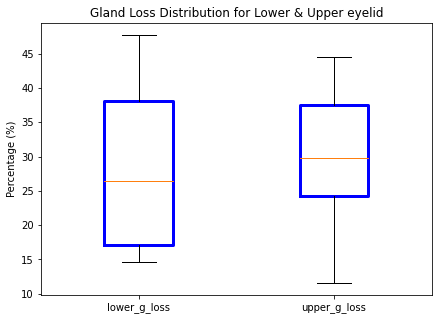

In [89]:
# Creating plot for gland loss (lower & upper eyelids separated)

lower_g_loss = np.array([14.58,17.91,34.95,47.68,])
upper_g_loss = np.array([11.63,24.32,29.86,37.6,44.52])

fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bp1 = ax.boxplot(lower_g_loss, positions=[1], widths=0.35, boxprops=boxprops1)
bp3 = ax.boxplot(upper_g_loss, positions=[2], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('Percentage (%)')
ax.set_xticklabels(['lower_g_loss', 'upper_g_loss'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])

plt.title("Gland Loss Distribution for Lower & Upper eyelid")
plt.show()

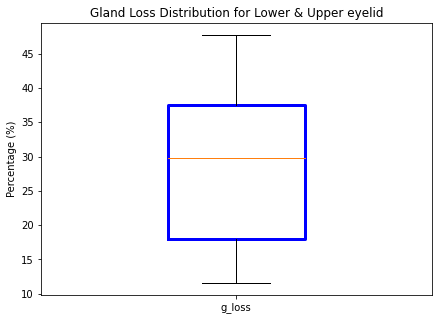

In [96]:
# Creating plot for gland loss (lower & upper eyelids combined)

g_loss = np.array([14.58,17.91,34.95,47.68,11.63,24.32,29.86,37.6,44.52])

fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bp1 = ax.boxplot(g_loss, positions=[1], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('Percentage (%)')
ax.set_xticklabels(['g_loss'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])

plt.title("Gland Loss Distribution for Lower & Upper eyelid")
plt.show()

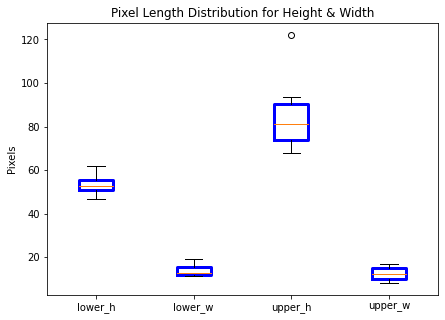

In [90]:
# Creating plot for height & width (lower & upper eyelids separated)
# These values were inserted manually from the above result

# v0.3
# lower_h = np.array([19.79,19.79,56.11,56.11,54.04,54.04,56.11,54.04,45.49,45.49])
# lower_w = np.array([10.23,10.23,24.92,24.92,27.53,27.53,24.92,27.53,25.89,25.89])
# upper_h = np.array([42.22,42.22,42.22,29.44,29.44,48.35,48.35,41.52,41.52,41.52,98.66,98.66,62.05,62.05,62.05])
# upper_w = np.array([12.94,12.94,12.94,14.37,14.37,13.89,13.89,21.15,21.15,21.15,26.77,26.77,23.43,23.43,23.43])

# v0.4
upper_h = np.array([81.47,80.99,93.54,71.7,121.84,67.78])
upper_w = np.array([8.37,11.98,9.51,15.94,12.44,16.68])
lower_h = np.array([53.22,52.41,46.77,62.05])
lower_w = np.array([11.77,11.26,19.3,14.03])

fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bp1 = ax.boxplot(lower_h, positions=[1], widths=0.35, boxprops=boxprops1)
bp2 = ax.boxplot(lower_w, positions=[2], widths=0.35, boxprops=boxprops1)
bp3 = ax.boxplot(upper_h, positions=[3], widths=0.35, boxprops=boxprops1)
bp4 = ax.boxplot(upper_w, positions=[4], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('Pixels')
ax.set_xticklabels(['lower_h', 'lower_w', 'upper_h', 'upper_w'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])

plt.title("Pixel Length Distribution for Height & Width")
plt.show()

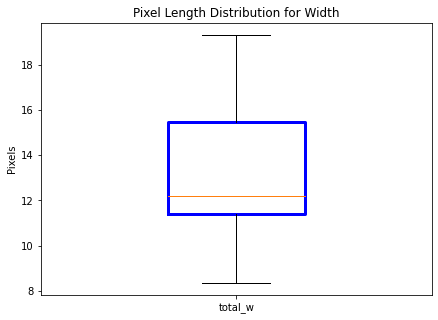

In [91]:
# v0.4
# Creating plot for width (lower & upper eyelids combined)

total_w = np.array([8.37,11.98,9.51,15.94,12.44,16.68,11.77,11.26,19.3,14.03])

fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bp1 = ax.boxplot(total_w, positions=[1], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('Pixels')
ax.set_xticklabels(['total_w'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])

plt.title("Pixel Length Distribution for Width")
plt.show()

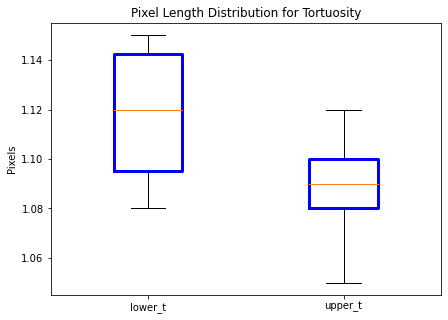

In [92]:
# Creating plot for tortuosity (lower & upper eyelids separated)

# v0.3
# lower_t = np.array([1.49,1.49,1.95,1.95,1.73,1.73,1.95,1.73,1.72,1.72])
# upper_t = np.array([1.9,1.9,1.9,1.66,1.66,2.33,2.33,1.83,1.83,1.83,1.62,1.62,2.42,2.42,2.42])

# v0.4
lower_t = np.array([1.08,1.15,1.14,1.1])
upper_t = np.array([1.05,1.1,1.08,1.1,1.08,1.12])

fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bp1 = ax.boxplot(lower_t, positions=[1], widths=0.35, boxprops=boxprops1)
bp2 = ax.boxplot(upper_t, positions=[2], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('Pixels')
ax.set_xticklabels(['lower_t', 'upper_t'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])

plt.title("Pixel Length Distribution for Tortuosity")
plt.show()

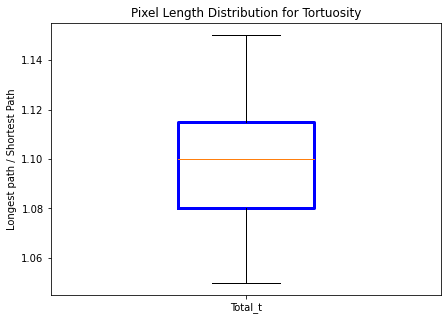

In [93]:
# Creating plot for tortuosity (lower & upper eyelids combined)

# v0.4
total_t = np.array([1.08,1.15,1.14,1.1,1.05,1.1,1.08,1.1,1.08,1.12])

fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bp1 = ax.boxplot(total_t, positions=[1], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('Longest path / Shortest Path')
ax.set_xticklabels(['Total_t'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])

plt.title("Pixel Length Distribution for Tortuosity")
plt.show()

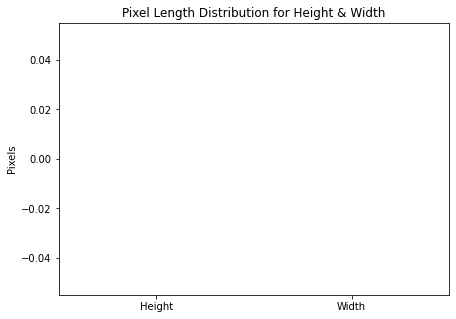

In [94]:
# Creating plot for height & width (lower & upper eyelids combined)
fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bp1 = ax.boxplot(array_l, positions=[1], widths=0.35, boxprops=boxprops1)
bp2 = ax.boxplot(array_w, positions=[2], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('Pixels')
ax.set_xticklabels(['Height', 'Width'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])

plt.title("Pixel Length Distribution for Height & Width")
plt.show()

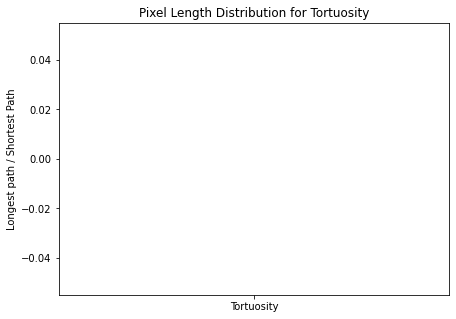

In [95]:
# Creating plot for tortuosity
fig, ax = plt.subplots(sharey=True)
# fig = plt.figure(figure =(5, 4))
fig.set_figheight(5)
fig.set_figwidth(7)

boxprops1 = dict(linestyle='-', linewidth=3, color='blue')
boxprops2 = dict(linestyle='-', linewidth=3, color='red')

bp1 = ax.boxplot(array_t, positions=[1], widths=0.35, boxprops=boxprops1)

ax.set_ylabel('Longest path / Shortest Path')
ax.set_xticklabels(['Tortuosity'])
# ax.set_xticklabels(['Mean', 'Class 1', 'Class 2'])

plt.title("Pixel Length Distribution for Tortuosity")
plt.show()

In [ ]:
array_t